In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/luna16/annotations.csv
/kaggle/input/luna16/candidates.csv
/kaggle/input/luna16/subset2/subset2/1.3.6.1.4.1.14519.5.2.1.6279.6001.311236942972970815890902714604.mhd
/kaggle/input/luna16/subset2/subset2/1.3.6.1.4.1.14519.5.2.1.6279.6001.212346425055214308006918165305.mhd
/kaggle/input/luna16/subset2/subset2/1.3.6.1.4.1.14519.5.2.1.6279.6001.281967919138248195763602360723.mhd
/kaggle/input/luna16/subset2/subset2/1.3.6.1.4.1.14519.5.2.1.6279.6001.707218743153927597786179232739.raw
/kaggle/input/luna16/subset2/subset2/1.3.6.1.4.1.14519.5.2.1.6279.6001.217697417596902141600884006982.mhd
/kaggle/input/luna16/subset2/subset2/1.3.6.1.4.1.14519.5.2.1.6279.6001.283569726884265181140892667131.raw
/kaggle/input/luna16/subset2/subset2/1.3.6.1.4.1.14519.5.2.1.6279.6001.192256506776434538421891524301.raw
/kaggle/input/luna16/subset2/subset2/1.3.6.1.4.1.14519.5.2.1.6279.6001.113586291551175790743673929831.raw
/kaggle/input/luna16/subset2/subset2/1.3.6.1.4.1.14519.5.2.1.6279.6001.22515481

In [2]:
# Import necessary libraries
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import pydicom
import tensorflow as tf

# Check GPU availability
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

2025-05-12 07:50:21.946519: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1747036222.176071      31 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1747036222.237189      31 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


Num GPUs Available:  1


In [3]:
# Load annotations
annotations_path = "/kaggle/input/luna16/annotations.csv"
annotations_df = pd.read_csv(annotations_path)

# Display first few rows
print("Annotations DataFrame:")
print(annotations_df.head())

Annotations DataFrame:
                                           seriesuid      coordX      coordY  \
0  1.3.6.1.4.1.14519.5.2.1.6279.6001.100225287222... -128.699421 -175.319272   
1  1.3.6.1.4.1.14519.5.2.1.6279.6001.100225287222...  103.783651 -211.925149   
2  1.3.6.1.4.1.14519.5.2.1.6279.6001.100398138793...   69.639017 -140.944586   
3  1.3.6.1.4.1.14519.5.2.1.6279.6001.100621383016...  -24.013824  192.102405   
4  1.3.6.1.4.1.14519.5.2.1.6279.6001.100621383016...    2.441547  172.464881   

       coordZ  diameter_mm  
0 -298.387506     5.651471  
1 -227.121250     4.224708  
2  876.374496     5.786348  
3 -391.081276     8.143262  
4 -405.493732    18.545150  


In [4]:
annotations_df.shape

(1186, 5)

In [5]:
# Load candidates_V2.csv
candidates_v2_path = "/kaggle/input/luna16/candidates.csv"
candidates_v2_df = pd.read_csv(candidates_v2_path)

# Display first few rows
print("Candidates_V2 DataFrame:")
print(candidates_v2_df.head())

# Explore class distribution
class_distribution = candidates_v2_df['class'].value_counts()
print("\nClass Distribution in Candidates_V2:")
print(class_distribution)

Candidates_V2 DataFrame:
                                           seriesuid  coordX  coordY  coordZ  \
0  1.3.6.1.4.1.14519.5.2.1.6279.6001.100225287222...  -56.08  -67.85 -311.92   
1  1.3.6.1.4.1.14519.5.2.1.6279.6001.100225287222...   53.21 -244.41 -245.17   
2  1.3.6.1.4.1.14519.5.2.1.6279.6001.100225287222...  103.66 -121.80 -286.62   
3  1.3.6.1.4.1.14519.5.2.1.6279.6001.100225287222...  -33.66  -72.75 -308.41   
4  1.3.6.1.4.1.14519.5.2.1.6279.6001.100225287222...  -32.25  -85.36 -362.51   

   class  
0      0  
1      0  
2      0  
3      0  
4      0  

Class Distribution in Candidates_V2:
class
0    549714
1      1351
Name: count, dtype: int64


In [6]:
# Path to the seg-lungs-LUNA16 folder
seg_lungs_path = "/kaggle/input/luna16/subset0/subset0"

# Extract seriesuid from filenames
seg_lungs_seriesuids = [
    os.path.splitext(filename)[0]  # Remove the .mhd extension
    for filename in os.listdir(seg_lungs_path)
    if filename.endswith(".mhd")
]

print(f"Number of unique seriesuids in seg-lungs-LUNA16: {len(seg_lungs_seriesuids)}")

Number of unique seriesuids in seg-lungs-LUNA16: 89


In [7]:
# Extract unique seriesuids from candidates_v2_df
candidates_v2_seriesuids = candidates_v2_df['seriesuid'].unique()

# Extract unique seriesuids from annotations_df
annotations_seriesuids = annotations_df['seriesuid'].unique()

print(f"Number of unique seriesuids in candidates_V2: {len(candidates_v2_seriesuids)}")
print(f"Number of unique seriesuids in annotations: {len(annotations_seriesuids)}")

Number of unique seriesuids in candidates_V2: 888
Number of unique seriesuids in annotations: 601


In [8]:
import SimpleITK as sitk

# Load the CT scan
 
ct_image = sitk.ReadImage("/kaggle/input/luna16/subset0/subset0/1.3.6.1.4.1.14519.5.2.1.6279.6001.108197895896446896160048741492.mhd")
ct_array = sitk.GetArrayFromImage(ct_image)

# Display metadata
print(f"CT Scan Shape: {ct_array.shape}")
print(f"Voxel Spacing: {ct_image.GetSpacing()}")
print(f"Origin: {ct_image.GetOrigin()}")

CT Scan Shape: (119, 512, 512)
Voxel Spacing: (0.7421879768371582, 0.7421879768371582, 2.5)
Origin: (-182.5, -190.0, -313.75)


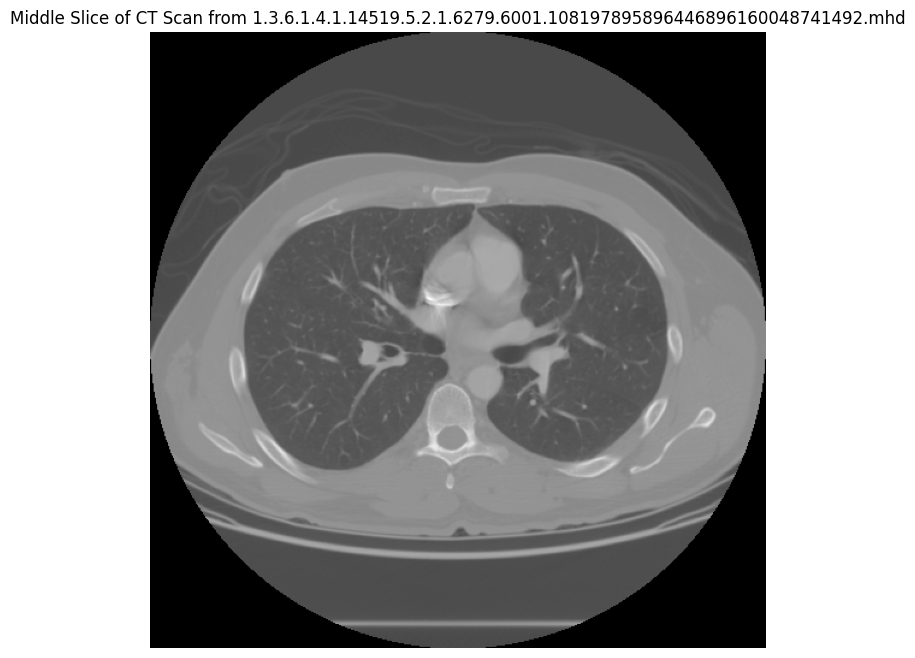

In [9]:
import os
import SimpleITK as sitk
import matplotlib.pyplot as plt

# Path to a sample CT scan
sample_scan_path = "/kaggle/input/luna16/subset0/subset0/1.3.6.1.4.1.14519.5.2.1.6279.6001.108197895896446896160048741492.mhd"

# Load the CT scan using SimpleITK
ct_image = sitk.ReadImage(sample_scan_path)
ct_array = sitk.GetArrayFromImage(ct_image)
# Display a middle slice
middle_slice_index = ct_array.shape[0] // 2
plt.figure(figsize=(8, 8))
plt.imshow(ct_array[middle_slice_index], cmap='gray')
plt.title(f"Middle Slice of CT Scan from {os.path.basename(sample_scan_path)}")
plt.axis('off')
plt.show()

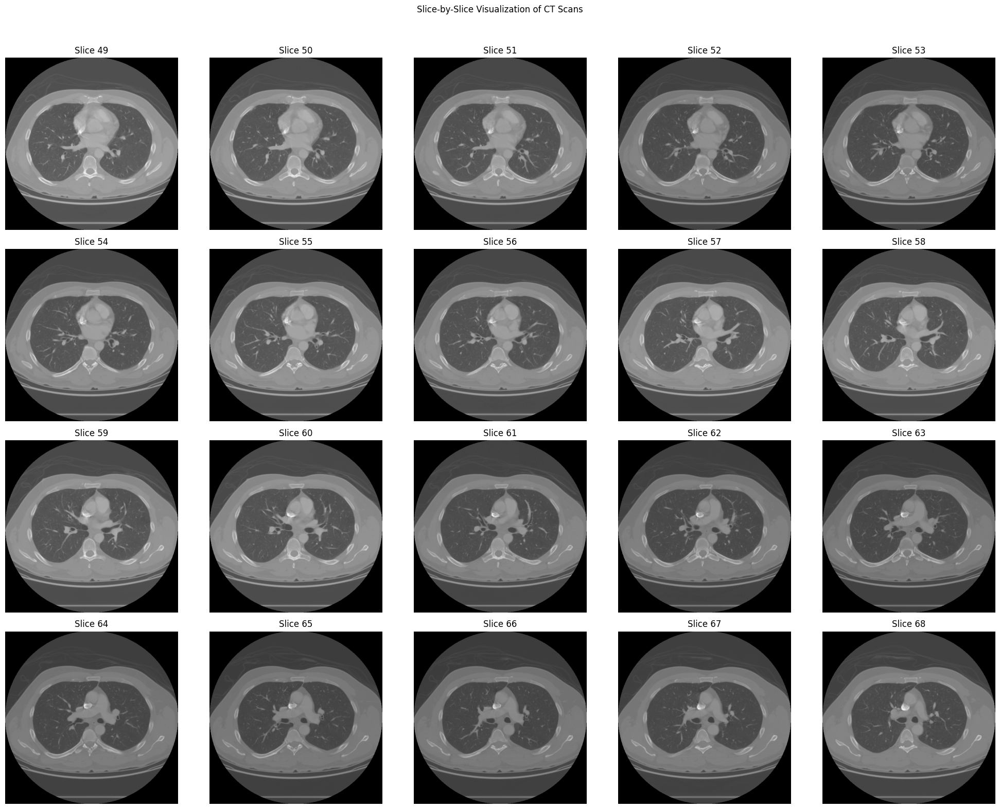

In [10]:
def plot_ct_slices(ct_scan):
    fig, axes = plt.subplots(4, 5, figsize=(20, 16))  # 4 rows, 5 columns
    axes = axes.flatten()
    for i, ax in enumerate(axes):
        slice_index = ct_scan.shape[0] // 2 + i - 10  # Center slices
        ax.imshow(ct_scan[slice_index], cmap='gray')
        ax.set_title(f"Slice {slice_index}")
        ax.axis('off')
    plt.suptitle("Slice-by-Slice Visualization of CT Scans")
    plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust layout for title
    plt.show()

# Example usage
plot_ct_slices(ct_array)

In [11]:
import SimpleITK as sitk

# Path to the segmentation mask
segmentation_path = "/kaggle/input/luna16/subset0/subset0/1.3.6.1.4.1.14519.5.2.1.6279.6001.108197895896446896160048741492.mhd"

# Load the segmentation mask
segmentation_mask = sitk.ReadImage(segmentation_path)
segmentation_array = sitk.GetArrayFromImage(segmentation_mask)

# Display metadata
print(f"Segmentation Mask Shape: {segmentation_array.shape}")

Segmentation Mask Shape: (119, 512, 512)


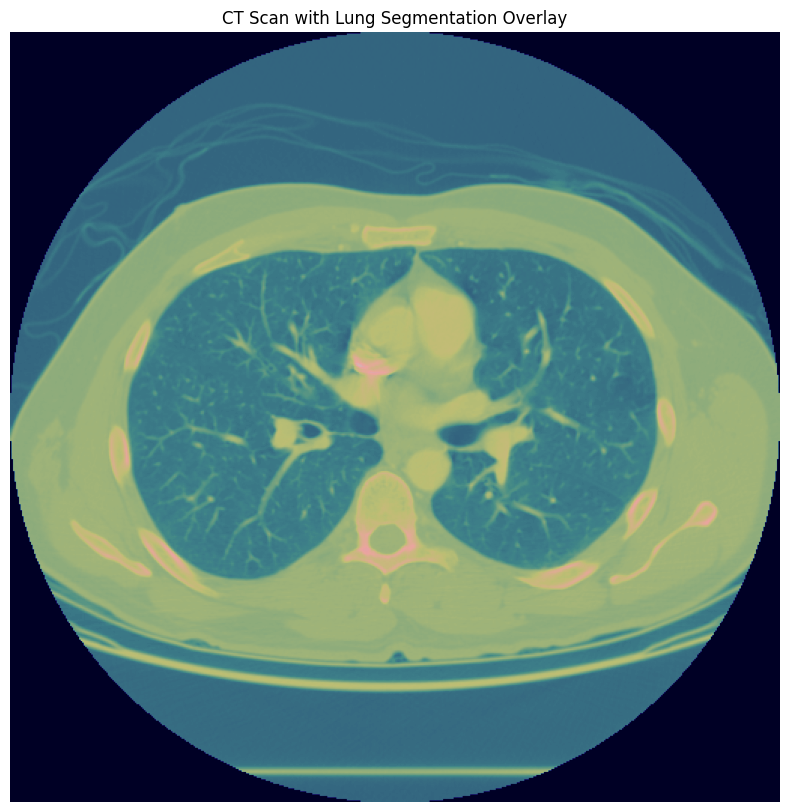

In [12]:
def plot_segmentation_overlay(ct_scan, segmentation_mask):
    slice_index = ct_scan.shape[0] // 2  # Middle slice
    plt.figure(figsize=(10, 10))
    plt.imshow(ct_scan[slice_index], cmap='gray')  # Original CT scan
    plt.imshow(segmentation_mask[slice_index], cmap='jet', alpha=0.3)  # Segmented lungs
    plt.title("CT Scan with Lung Segmentation Overlay")
    plt.axis('off')
    plt.show()

# Example usage
plot_segmentation_overlay(ct_array, segmentation_array)

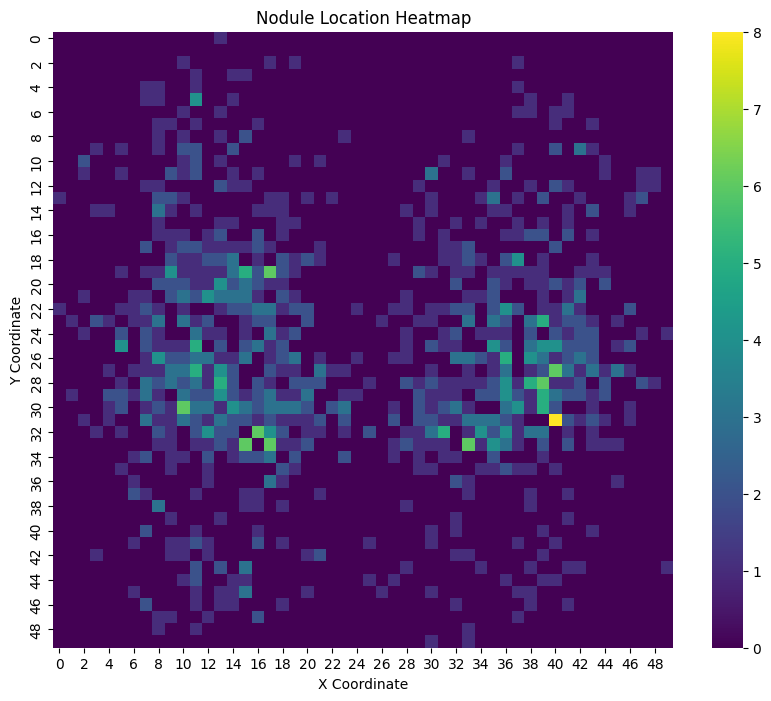

In [13]:
import seaborn as sns

def plot_nodule_heatmap(annotations_df):
    coords = annotations_df[['coordX', 'coordY']].values
    heatmap, xedges, yedges = np.histogram2d(coords[:, 0], coords[:, 1], bins=50)
    plt.figure(figsize=(10, 8))
    sns.heatmap(heatmap.T, cmap='viridis')
    plt.title("Nodule Location Heatmap")
    plt.xlabel("X Coordinate")
    plt.ylabel("Y Coordinate")
    plt.show()

# Example usage
plot_nodule_heatmap(annotations_df)

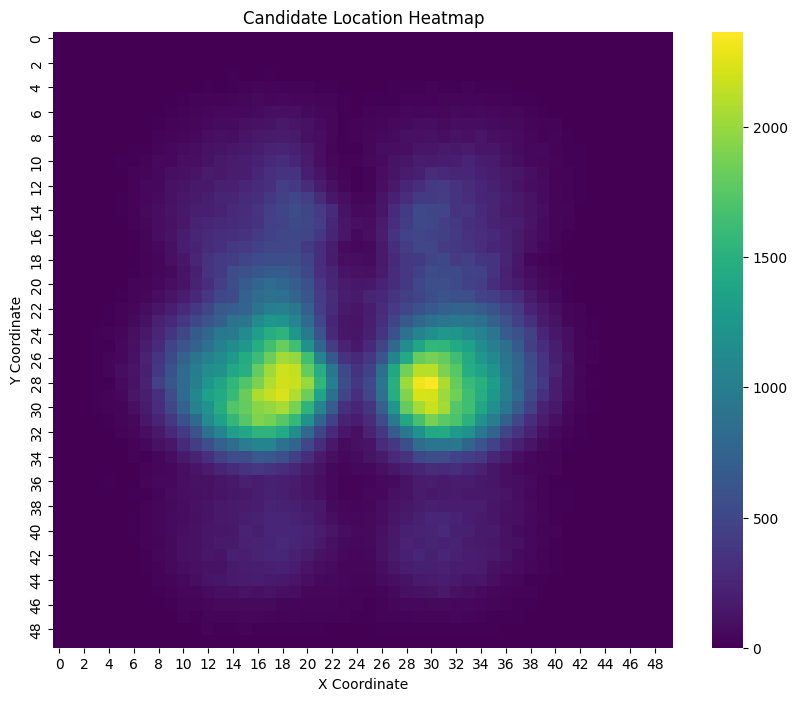

In [14]:
def plot_candidate_distribution(candidates_df):
    coords = candidates_df[['coordX', 'coordY']].values
    heatmap, xedges, yedges = np.histogram2d(coords[:, 0], coords[:, 1], bins=50)
    plt.figure(figsize=(10, 8))
    sns.heatmap(heatmap.T, cmap='viridis')
    plt.title("Candidate Location Heatmap")
    plt.xlabel("X Coordinate")
    plt.ylabel("Y Coordinate")
    plt.show()

# Example usage
plot_candidate_distribution(candidates_v2_df)

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


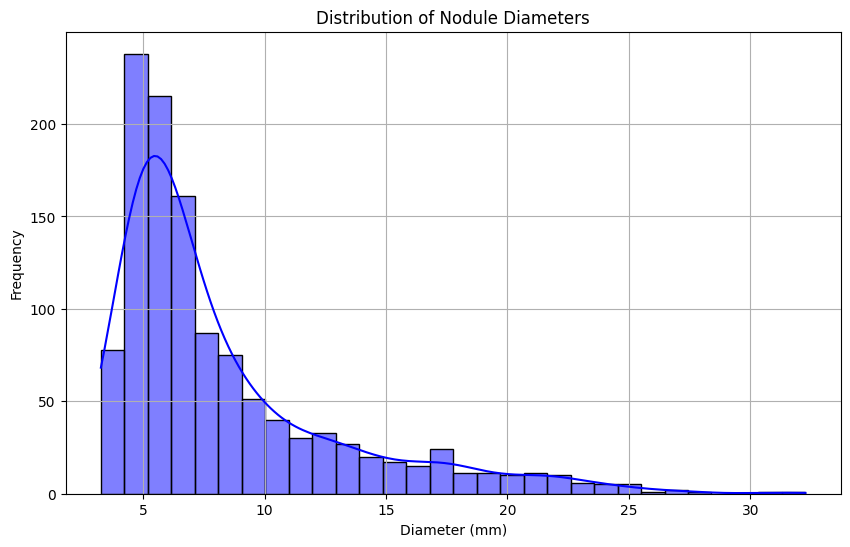

In [15]:
import matplotlib.pyplot as plt
import seaborn as sns

# Extract nodule diameters from annotations_df
nodule_diameters = annotations_df['diameter_mm']

# Plot histogram of nodule diameters
plt.figure(figsize=(10, 6))
sns.histplot(nodule_diameters, bins=30, kde=True, color='blue')
plt.title("Distribution of Nodule Diameters")
plt.xlabel("Diameter (mm)")
plt.ylabel("Frequency")
plt.grid(True)
plt.show()

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


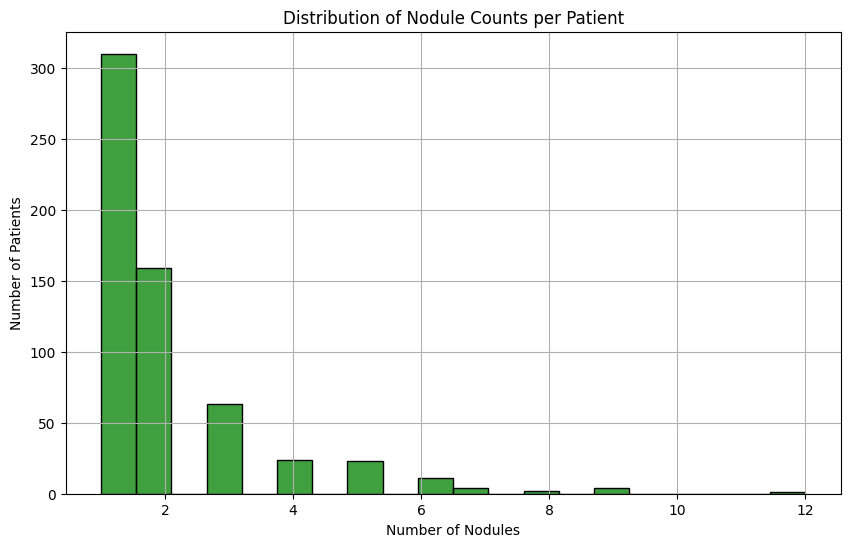

In [16]:
# Count the number of nodules per seriesuid (patient)
nodule_counts_per_patient = annotations_df['seriesuid'].value_counts()

# Plot histogram of nodule counts
plt.figure(figsize=(10, 6))
sns.histplot(nodule_counts_per_patient, bins=20, kde=False, color='green')
plt.title("Distribution of Nodule Counts per Patient")
plt.xlabel("Number of Nodules")
plt.ylabel("Number of Patients")
plt.grid(True)
plt.show()

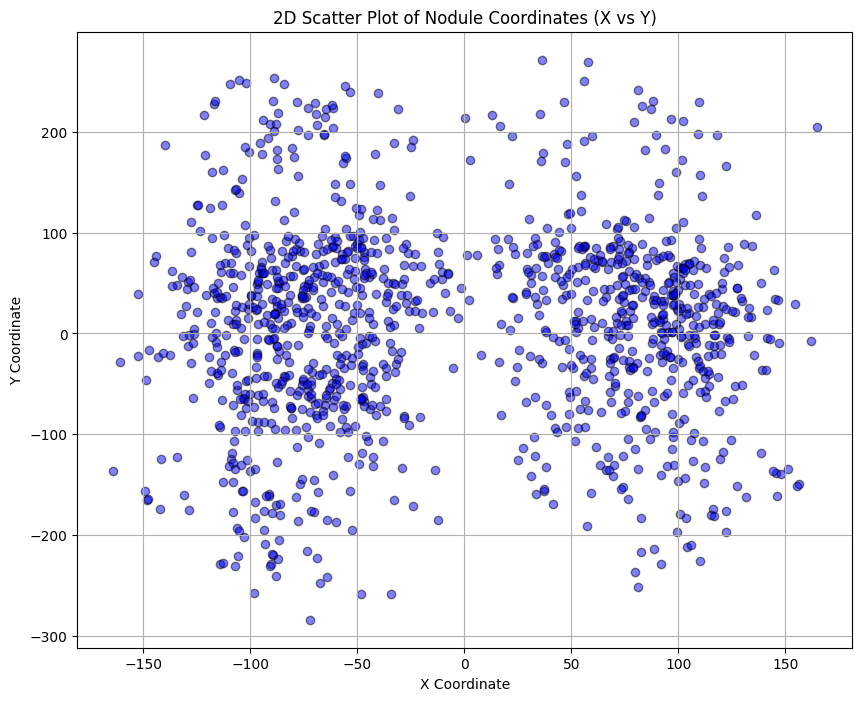

In [17]:
# Extract X and Y coordinates of nodules
x_coords = annotations_df['coordX']
y_coords = annotations_df['coordY']

# Create 2D scatter plot
plt.figure(figsize=(10, 8))
plt.scatter(x_coords, y_coords, alpha=0.5, color='blue', edgecolor='black')
plt.title("2D Scatter Plot of Nodule Coordinates (X vs Y)")
plt.xlabel("X Coordinate")
plt.ylabel("Y Coordinate")
plt.grid(True)
plt.show()

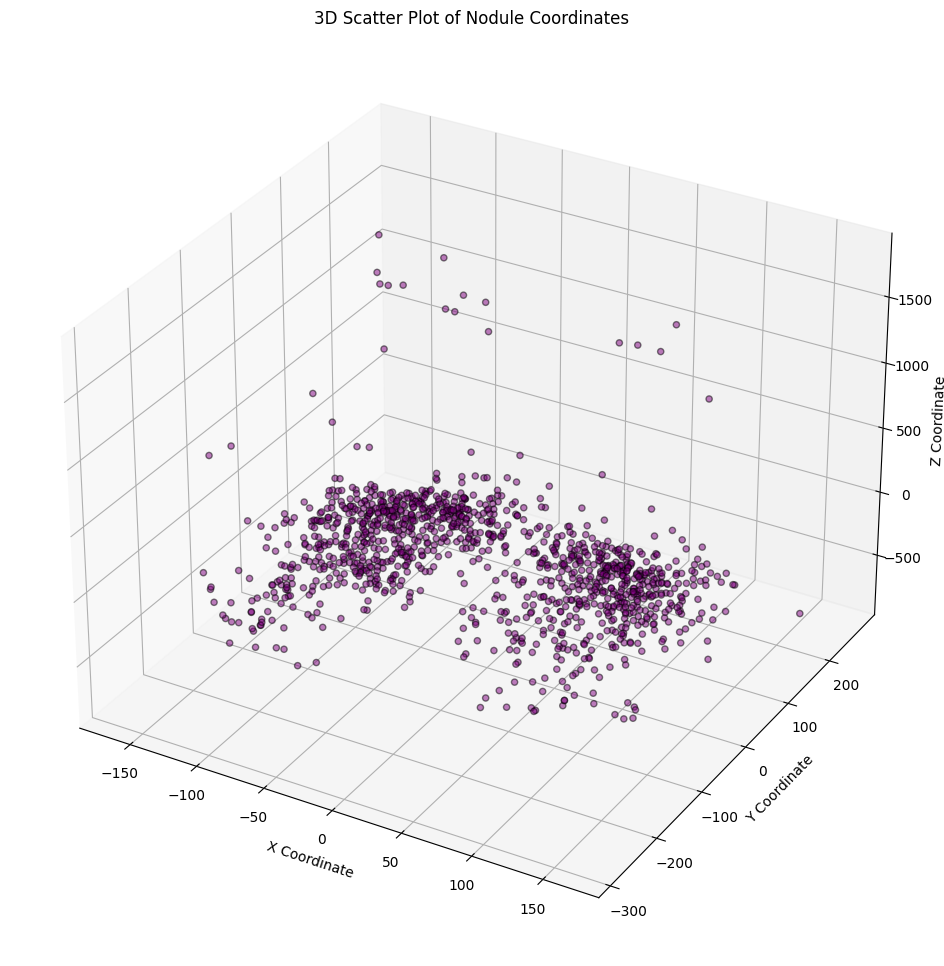

In [18]:
from mpl_toolkits.mplot3d import Axes3D

# Extract X, Y, and Z coordinates of nodules
x_coords = annotations_df['coordX']
y_coords = annotations_df['coordY']
z_coords = annotations_df['coordZ']

# Create 3D scatter plot
fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(x_coords, y_coords, z_coords, alpha=0.5, color='purple', edgecolor='black')
ax.set_title("3D Scatter Plot of Nodule Coordinates")
ax.set_xlabel("X Coordinate")
ax.set_ylabel("Y Coordinate")
ax.set_zlabel("Z Coordinate")
plt.show()

In [19]:
import os
import SimpleITK as sitk

# Path to the seg-lungs-LUNA16 folder
seg_lungs_path = "/kaggle/input/luna16/subset0/subset0"

# Get a list of all .mhd files in the folder
mhd_files = [f for f in os.listdir(seg_lungs_path) if f.endswith(".mhd")]

print(f"Number of .mhd files: {len(mhd_files)}")

Number of .mhd files: 89


  0%|          | 0/178 [00:00<?, ?it/s]

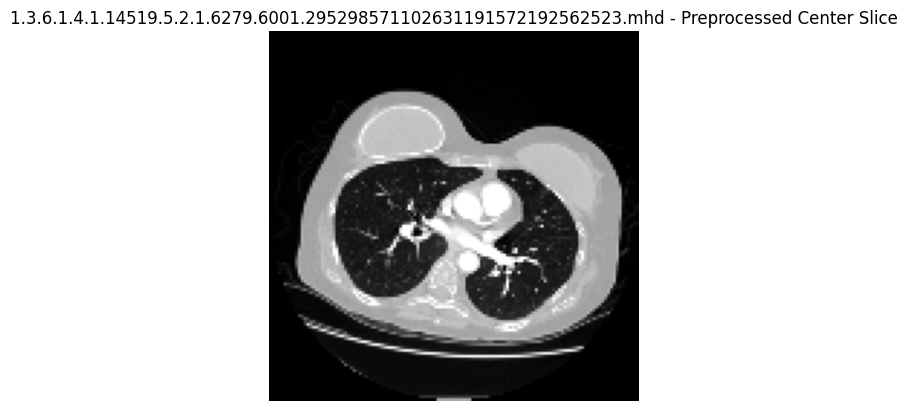

[ WARN:0@1.627] global loadsave.cpp:848 imwrite_ Unsupported depth image for selected encoder is fallbacked to CV_8U.
  2%|▏         | 4/178 [00:02<01:39,  1.75it/s]

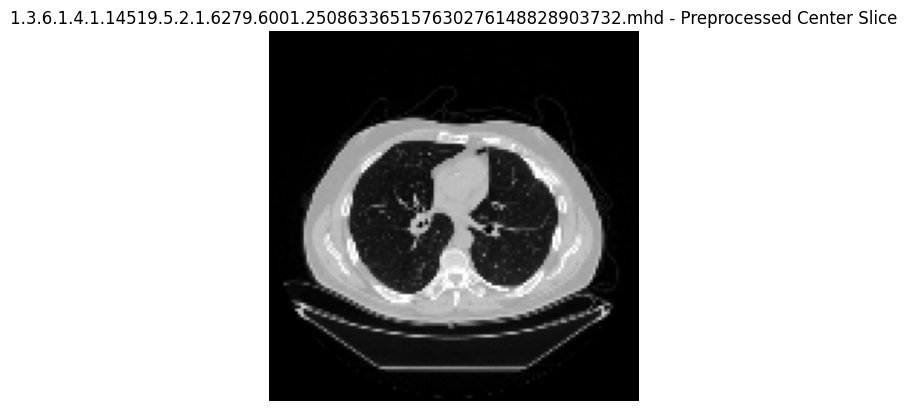

  3%|▎         | 5/178 [00:04<03:13,  1.12s/it]

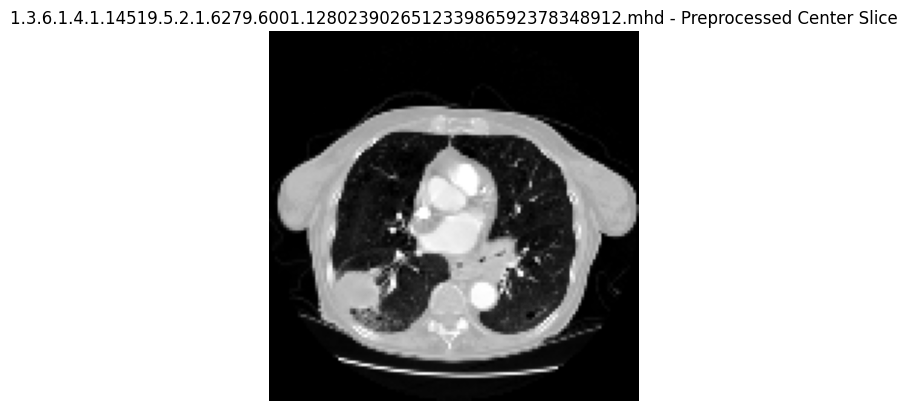

  4%|▍         | 7/178 [00:06<02:40,  1.06it/s]

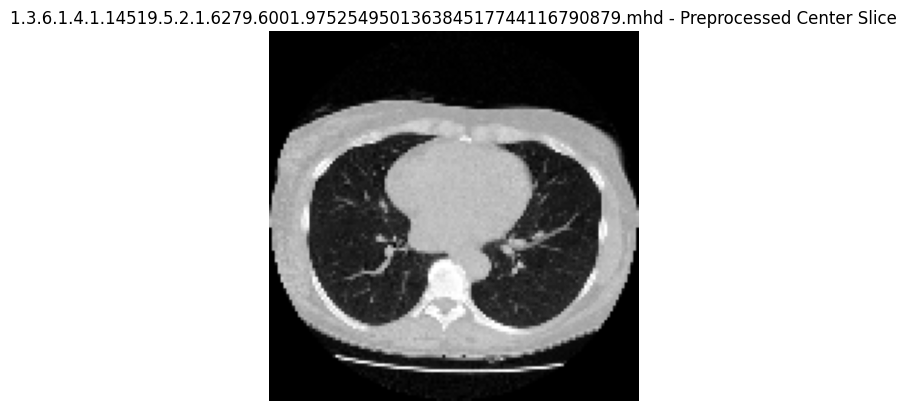

  6%|▌         | 10/178 [00:07<02:00,  1.39it/s]

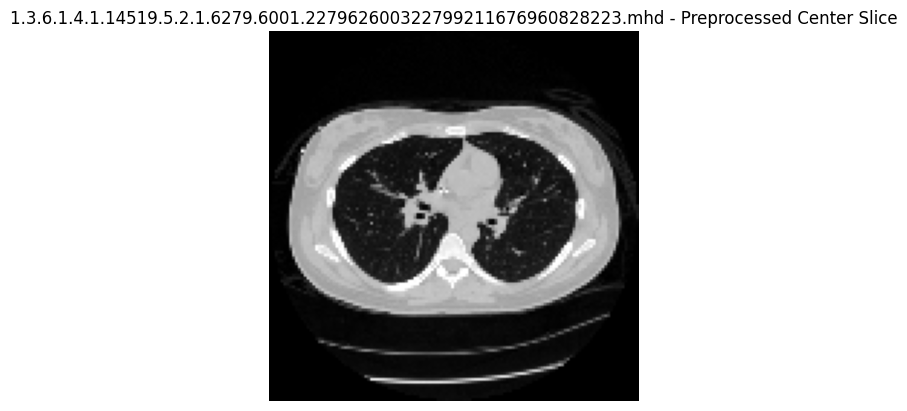

  7%|▋         | 12/178 [00:09<02:13,  1.24it/s]

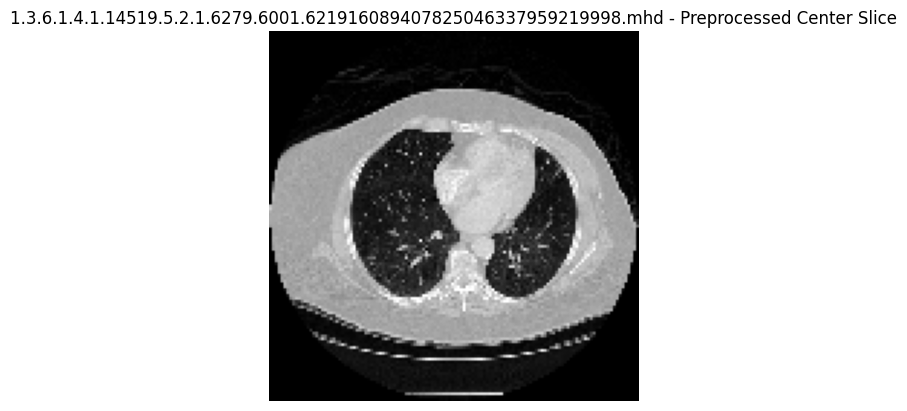

  7%|▋         | 13/178 [00:11<02:31,  1.09it/s]

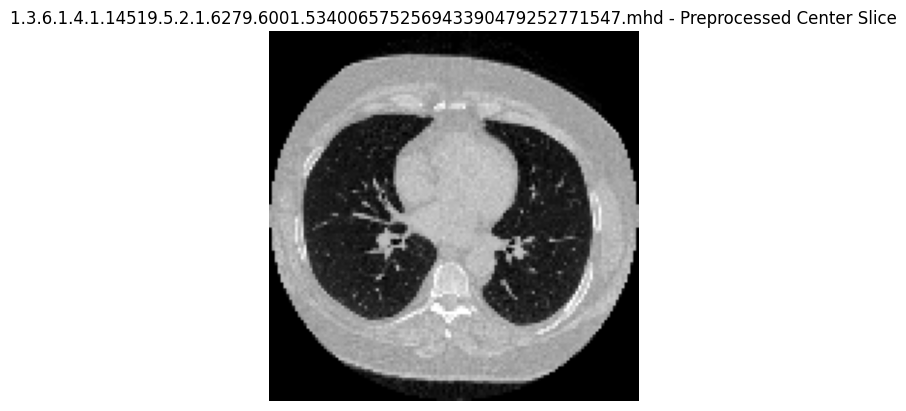

  8%|▊         | 14/178 [00:16<04:57,  1.81s/it]

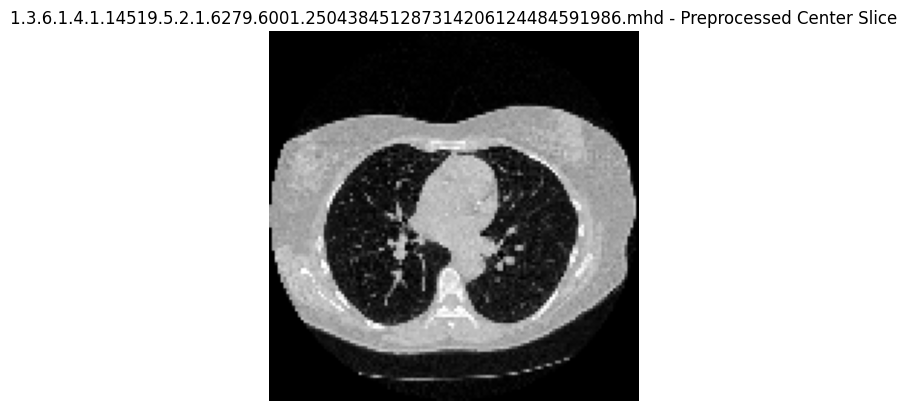

  8%|▊         | 15/178 [00:18<05:12,  1.92s/it]

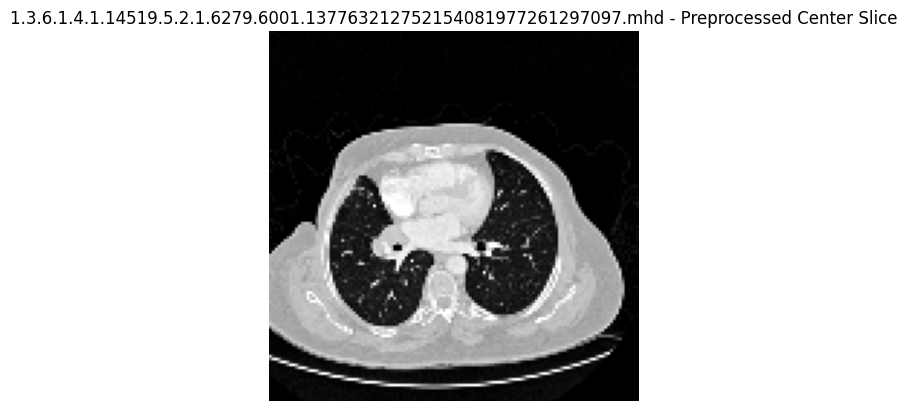

  9%|▉         | 16/178 [00:21<05:34,  2.06s/it]

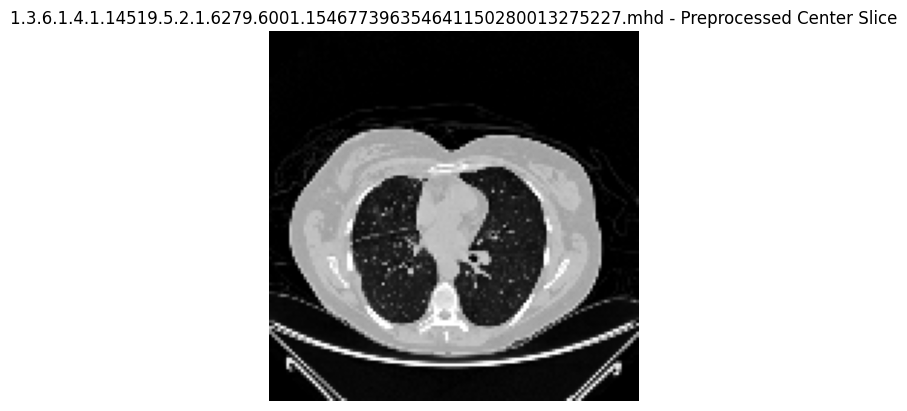

 10%|▉         | 17/178 [00:23<05:59,  2.23s/it]

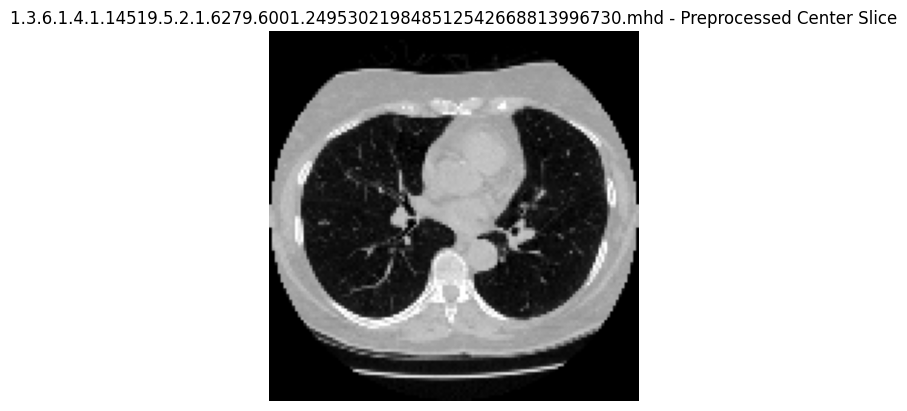

 10%|█         | 18/178 [00:28<07:32,  2.83s/it]

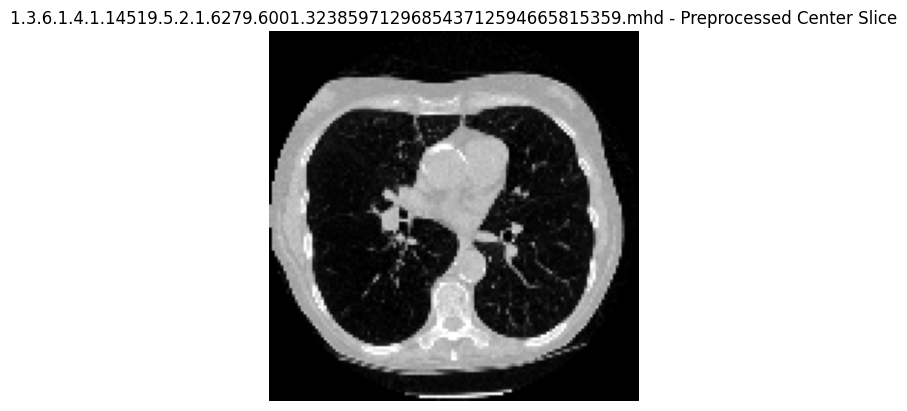

 11%|█         | 19/178 [00:30<07:21,  2.77s/it]

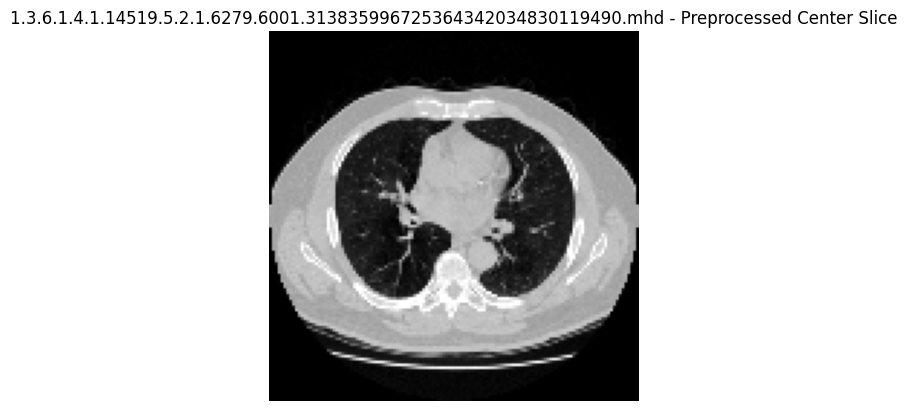

 11%|█         | 20/178 [00:35<08:23,  3.18s/it]

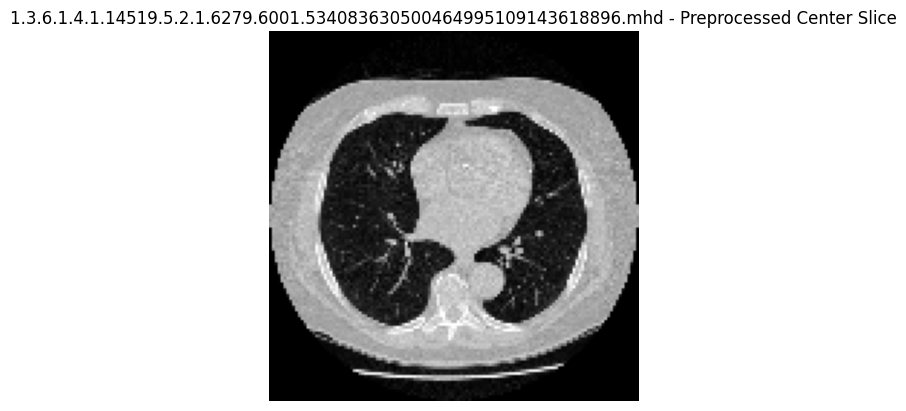

 12%|█▏        | 21/178 [00:37<07:40,  2.93s/it]

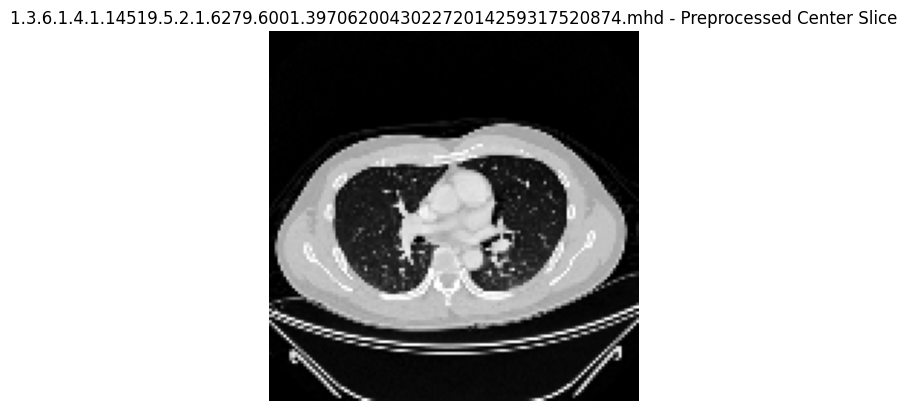

 15%|█▍        | 26/178 [00:40<03:26,  1.36s/it]

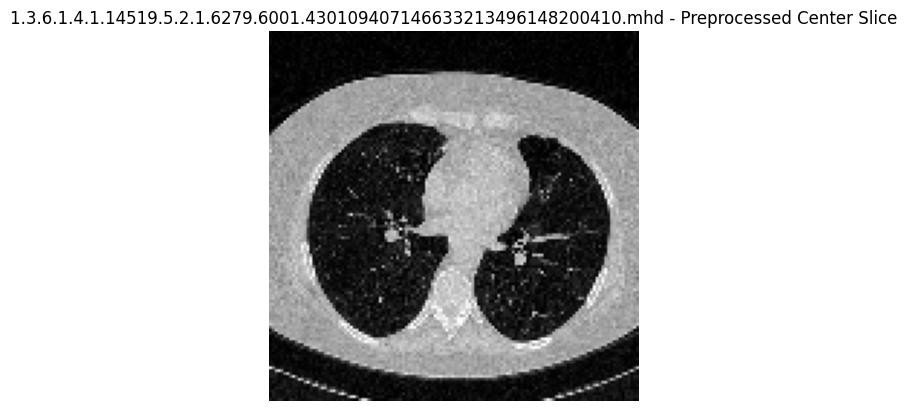

 16%|█▋        | 29/178 [00:47<04:16,  1.72s/it]

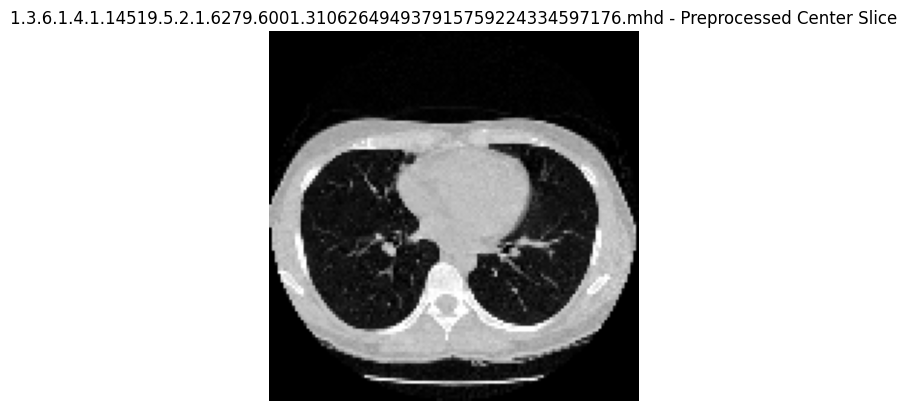

 18%|█▊        | 32/178 [00:48<03:08,  1.29s/it]

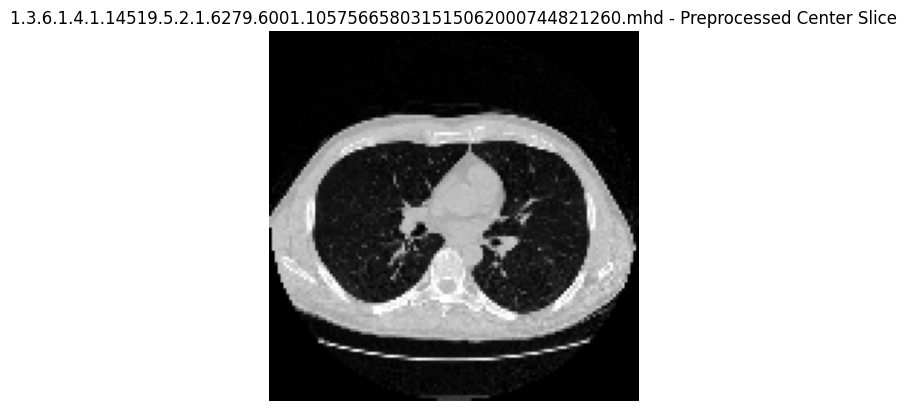

 19%|█▊        | 33/178 [00:50<03:07,  1.29s/it]

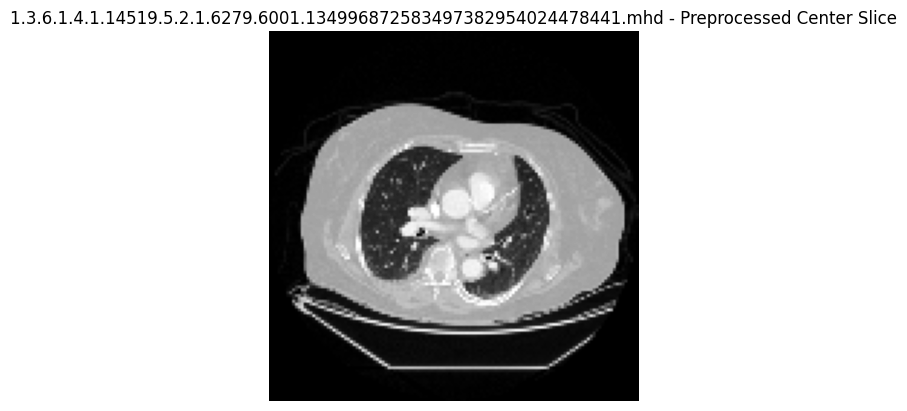

 22%|██▏       | 39/178 [00:52<01:44,  1.33it/s]

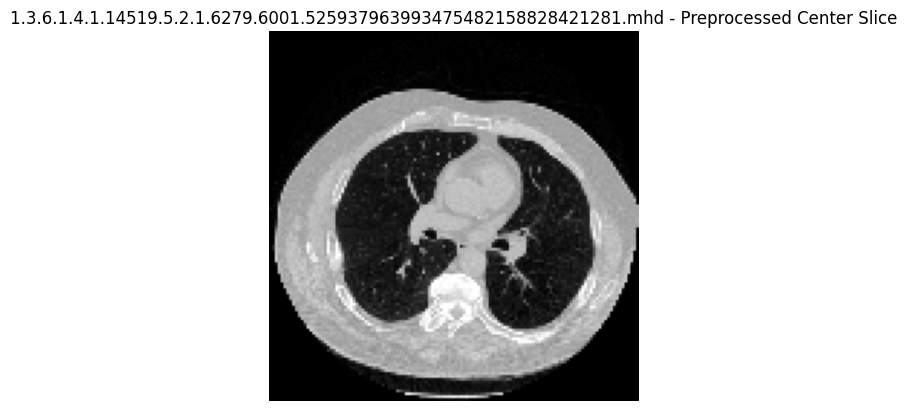

 23%|██▎       | 41/178 [00:56<02:28,  1.08s/it]

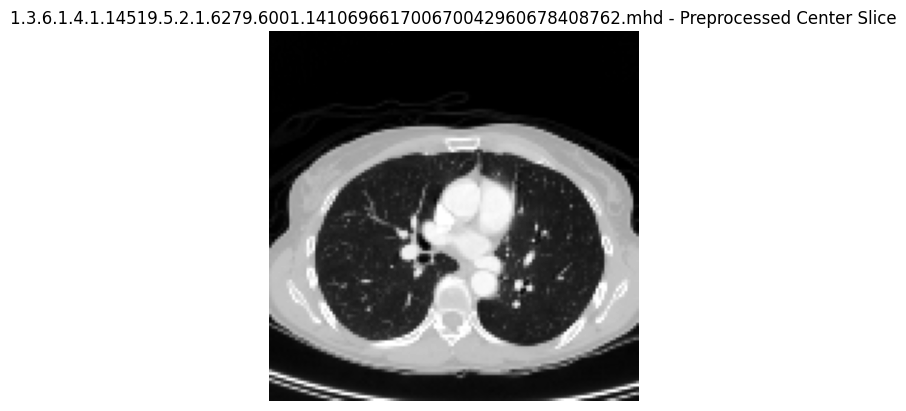

 25%|██▍       | 44/178 [00:59<02:17,  1.03s/it]

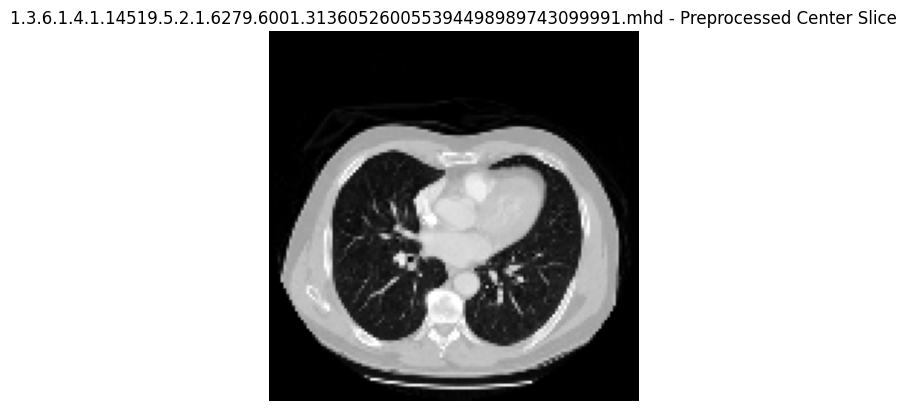

 25%|██▌       | 45/178 [01:00<02:23,  1.08s/it]

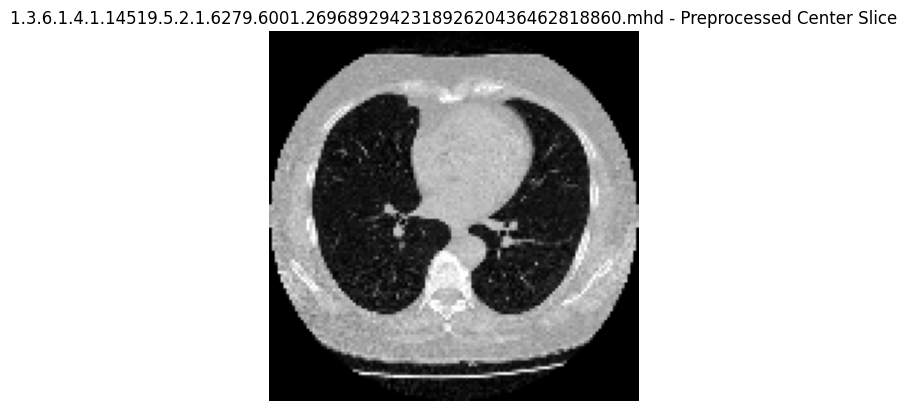

 28%|██▊       | 49/178 [01:02<01:39,  1.30it/s]

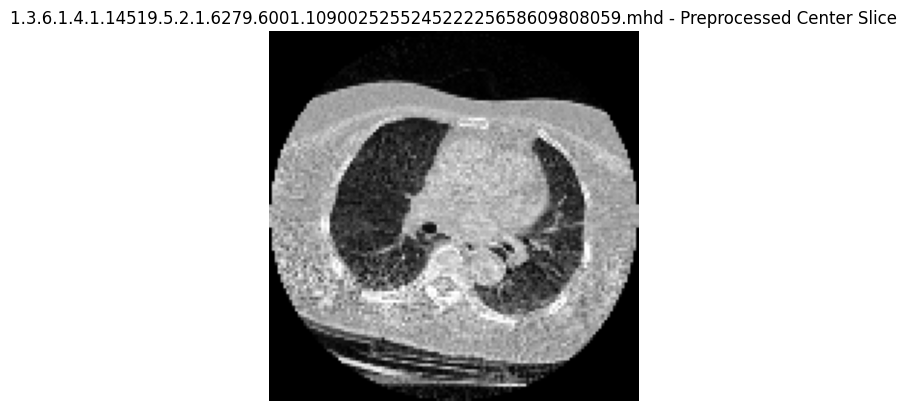

 28%|██▊       | 50/178 [01:04<01:56,  1.10it/s]

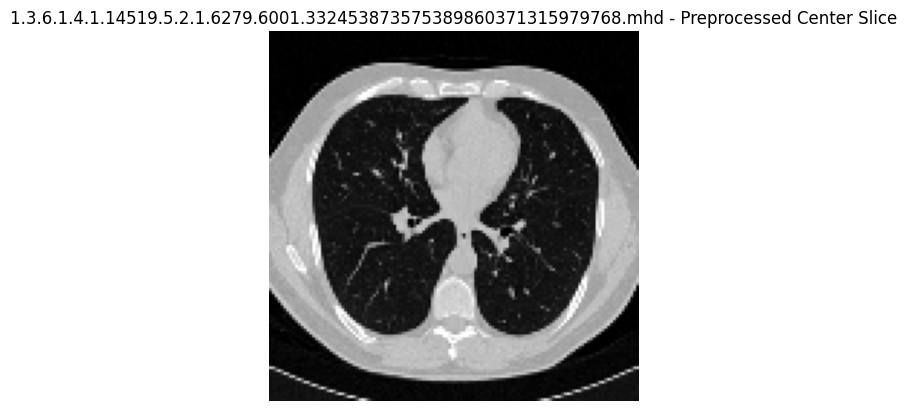

 29%|██▊       | 51/178 [01:06<02:21,  1.11s/it]

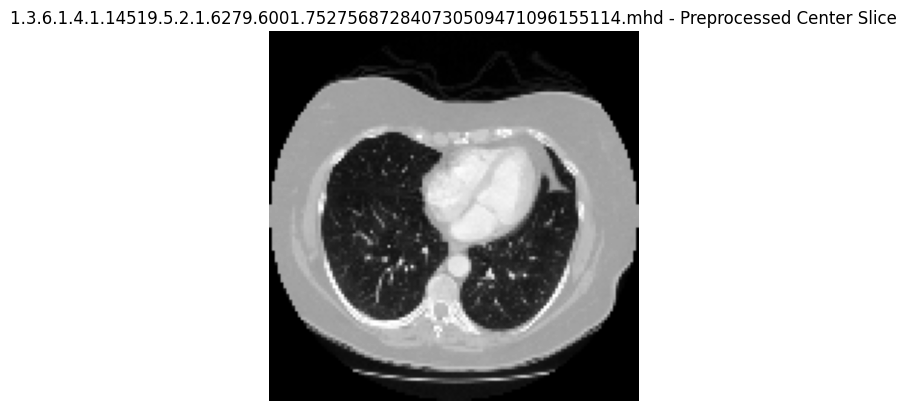

 30%|███       | 54/178 [01:07<01:44,  1.19it/s]

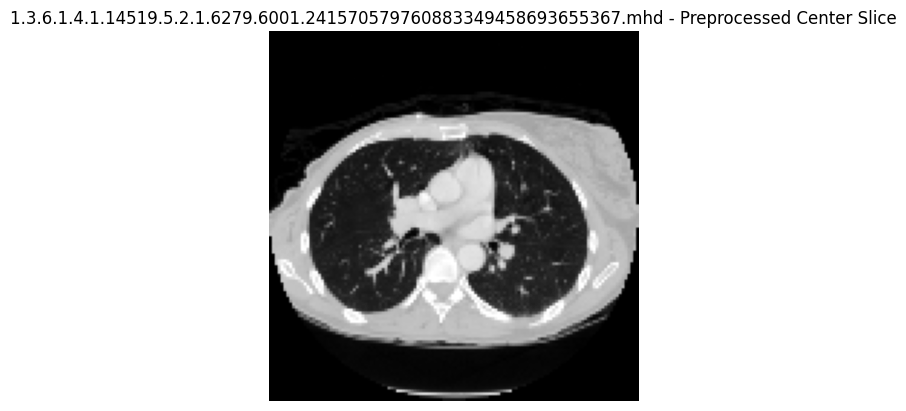

 31%|███       | 55/178 [01:10<02:25,  1.18s/it]

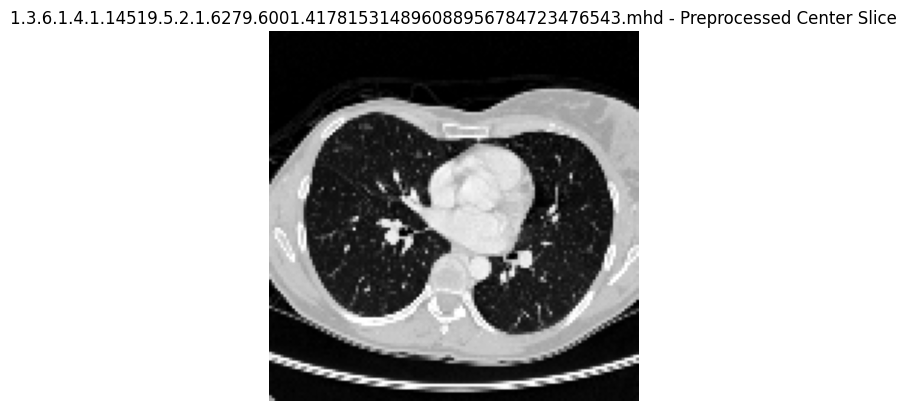

 33%|███▎      | 58/178 [01:13<02:11,  1.09s/it]

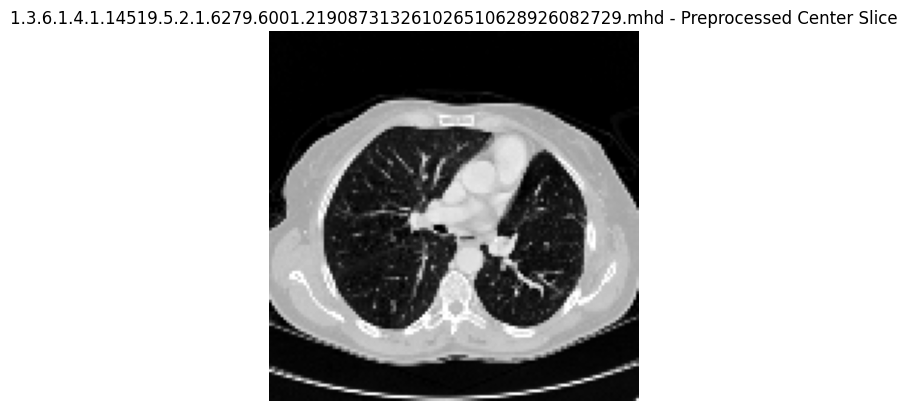

 34%|███▎      | 60/178 [01:16<02:18,  1.18s/it]

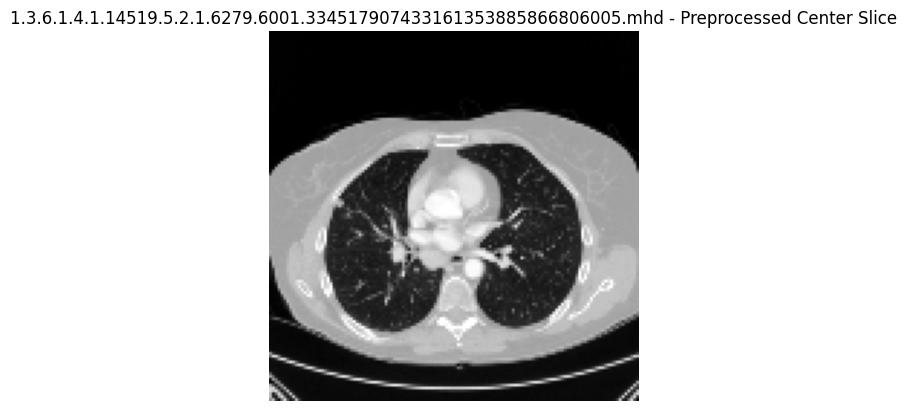

 35%|███▍      | 62/178 [01:19<02:22,  1.23s/it]

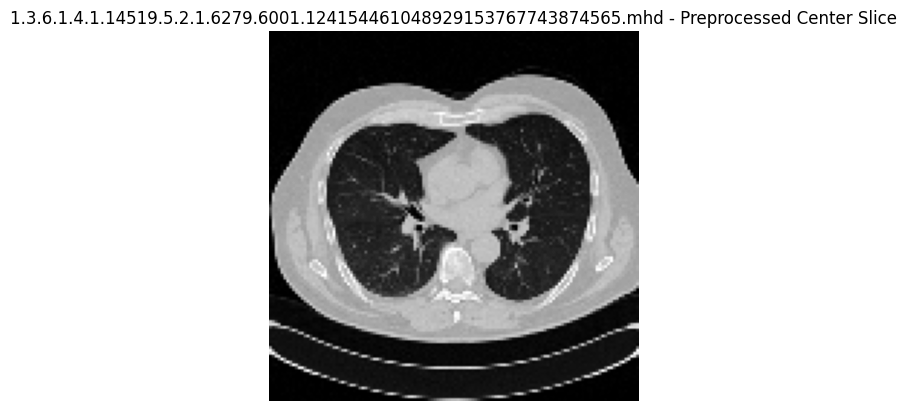

 37%|███▋      | 66/178 [01:21<01:41,  1.10it/s]

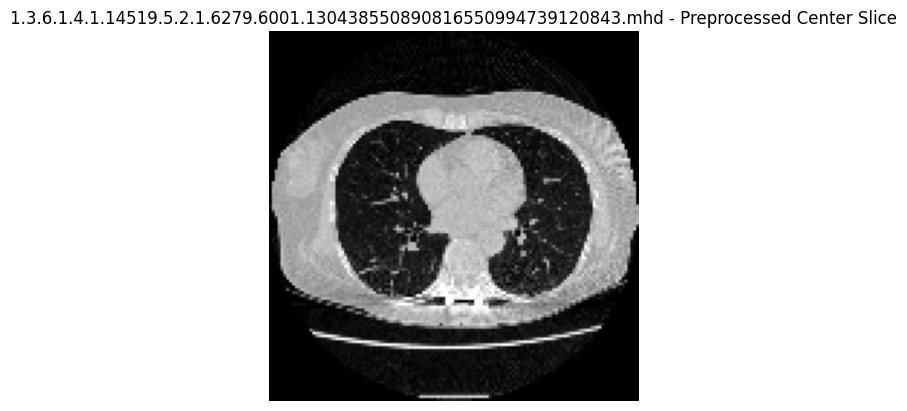

 38%|███▊      | 67/178 [01:23<02:05,  1.13s/it]

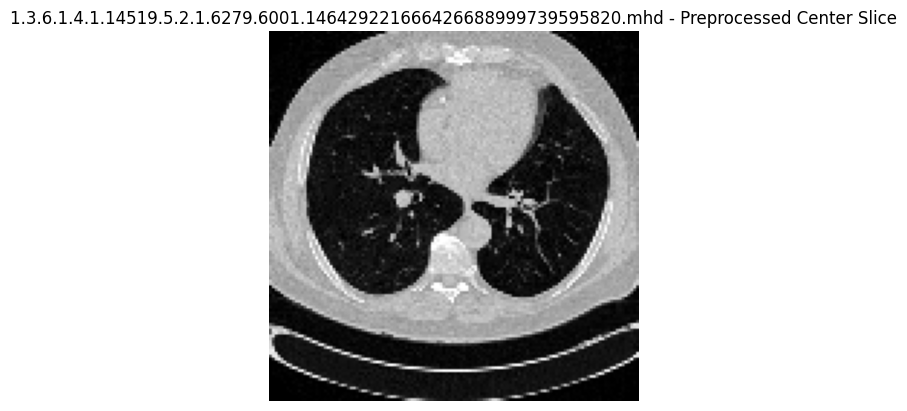

 39%|███▉      | 70/178 [01:30<02:47,  1.55s/it]

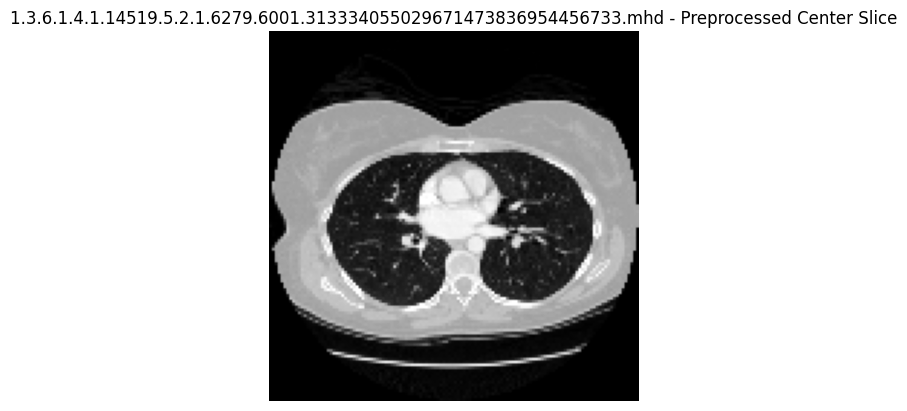

 40%|███▉      | 71/178 [01:31<02:43,  1.53s/it]

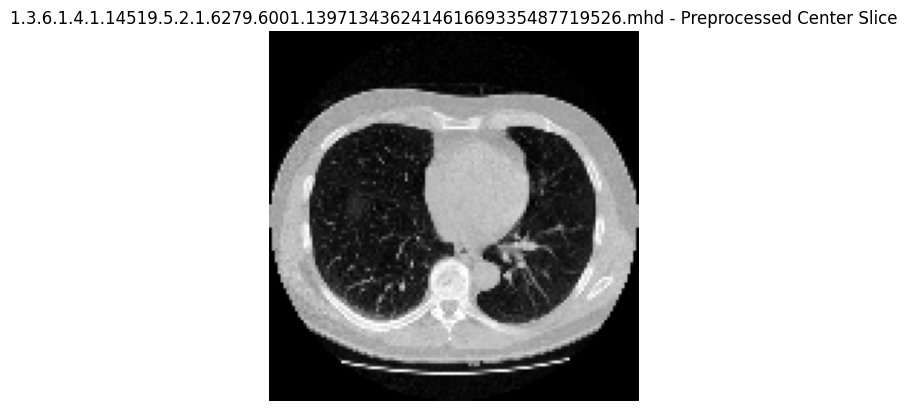

 40%|████      | 72/178 [01:33<02:41,  1.53s/it]

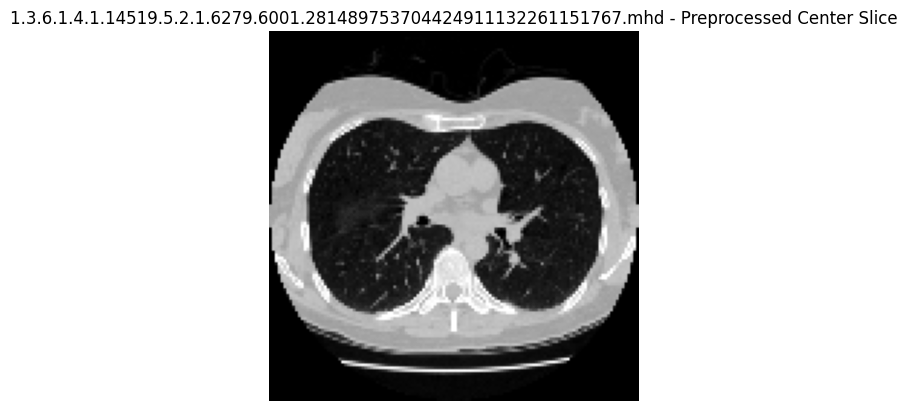

 41%|████      | 73/178 [01:37<03:34,  2.04s/it]

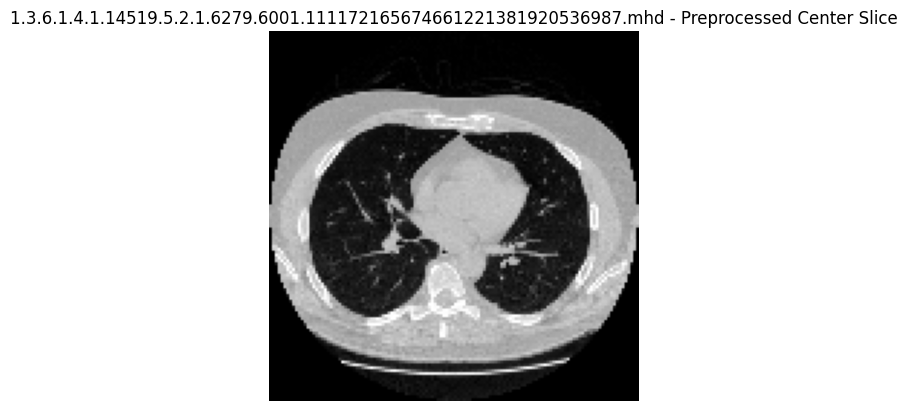

 42%|████▏     | 75/178 [01:42<03:43,  2.17s/it]

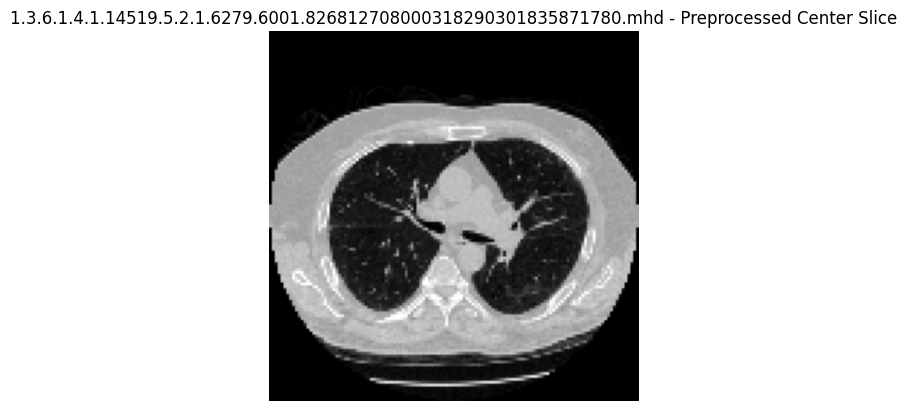

 43%|████▎     | 76/178 [01:45<04:16,  2.51s/it]

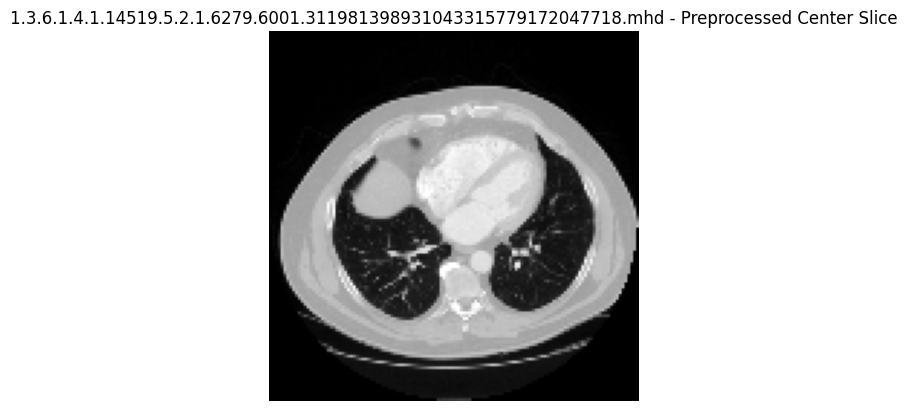

 43%|████▎     | 77/178 [01:47<03:51,  2.29s/it]

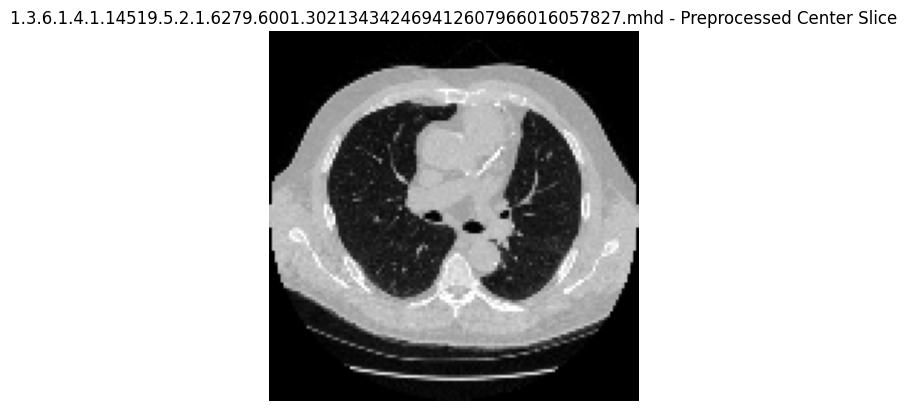

 44%|████▍     | 79/178 [01:50<03:24,  2.06s/it]

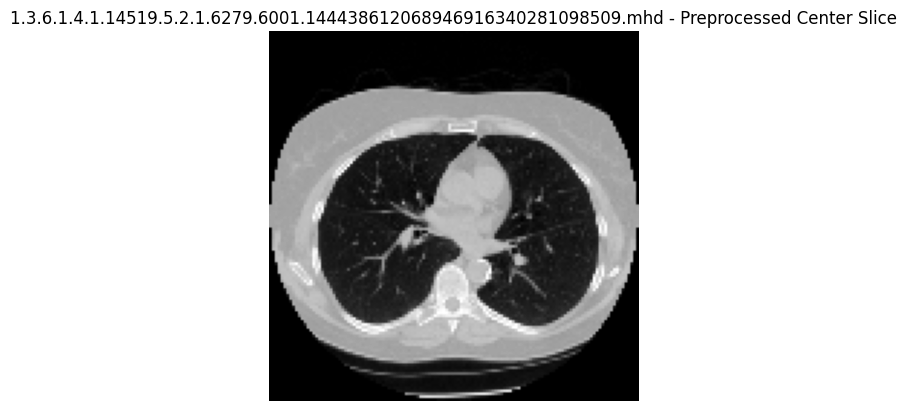

 45%|████▍     | 80/178 [01:52<03:10,  1.95s/it]

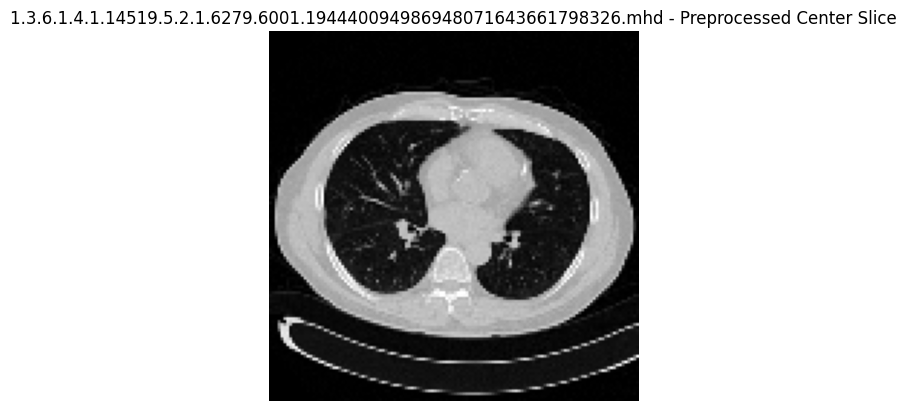

 46%|████▌     | 81/178 [01:54<03:08,  1.95s/it]

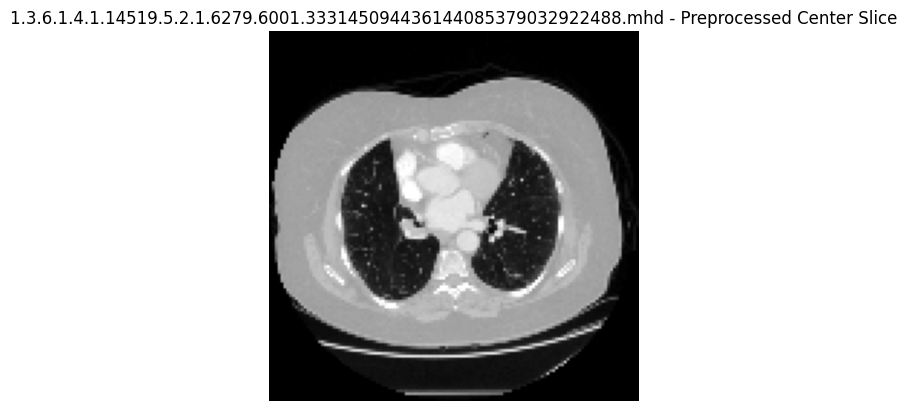

 46%|████▌     | 82/178 [01:55<02:56,  1.83s/it]

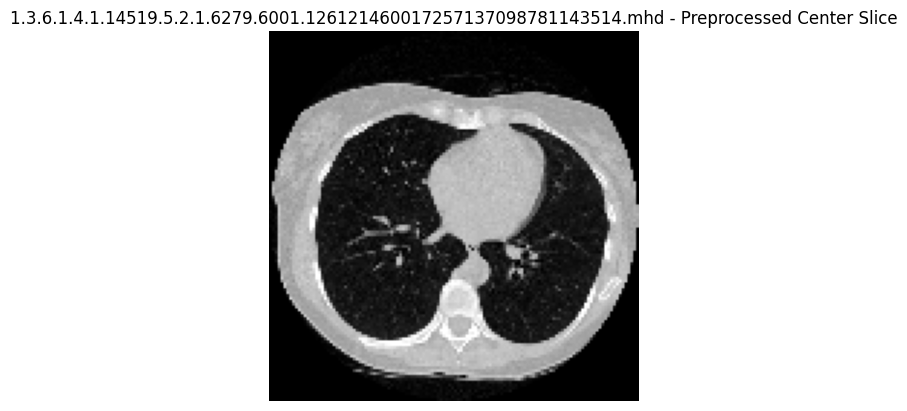

 47%|████▋     | 84/178 [01:57<02:08,  1.37s/it]

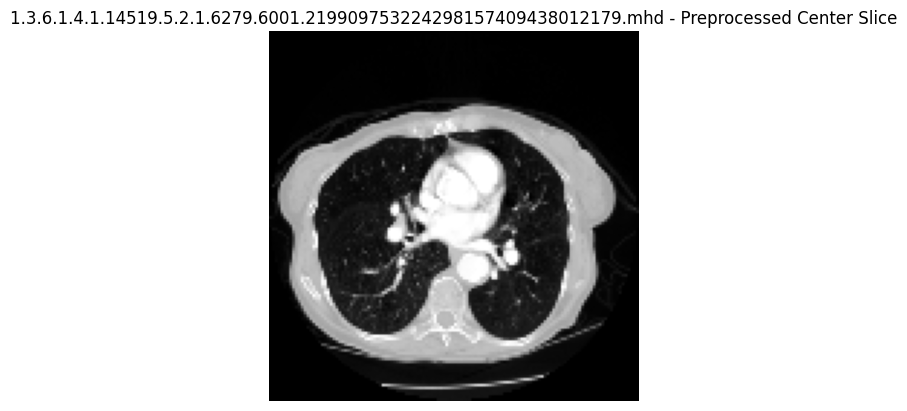

 49%|████▉     | 87/178 [01:58<01:26,  1.06it/s]

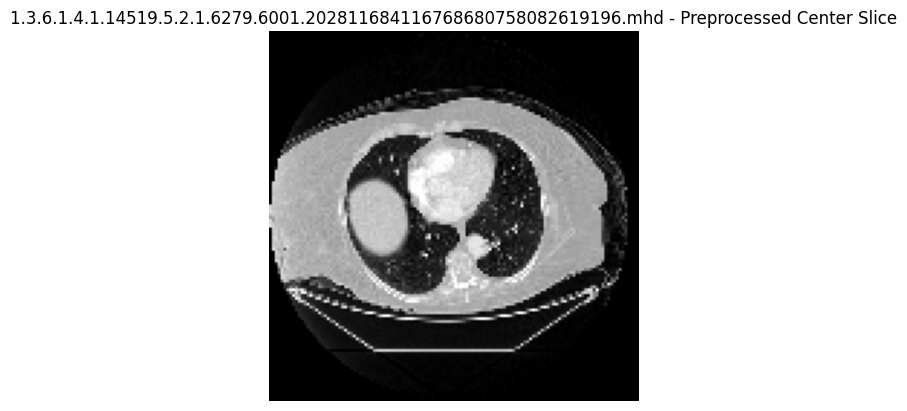

 49%|████▉     | 88/178 [02:00<01:32,  1.03s/it]

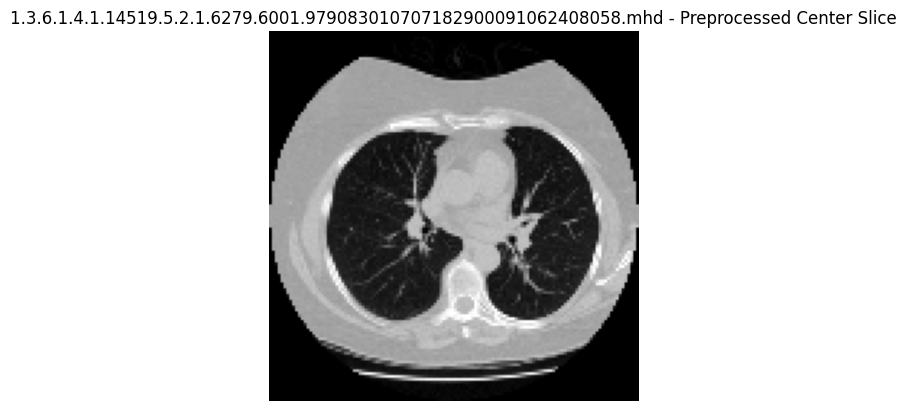

 51%|█████     | 90/178 [02:01<01:21,  1.08it/s]

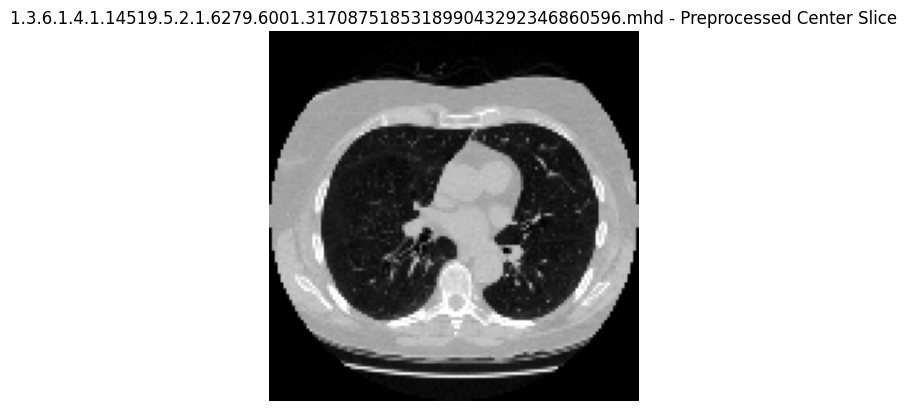

 51%|█████     | 91/178 [02:05<02:16,  1.56s/it]

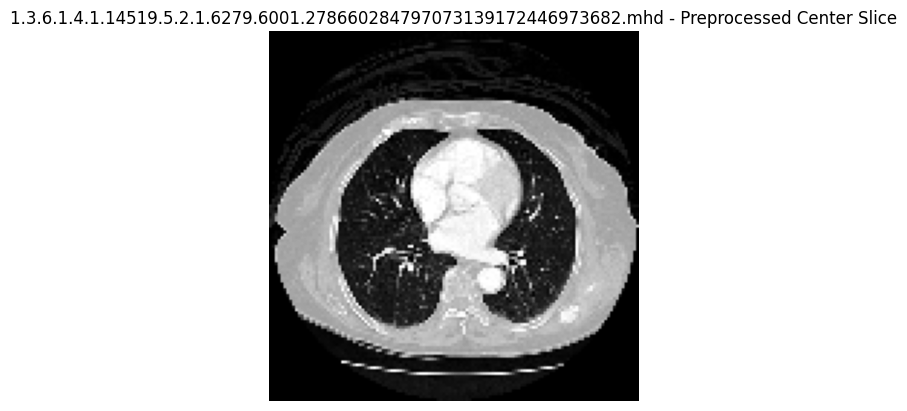

 52%|█████▏    | 92/178 [02:07<02:09,  1.50s/it]

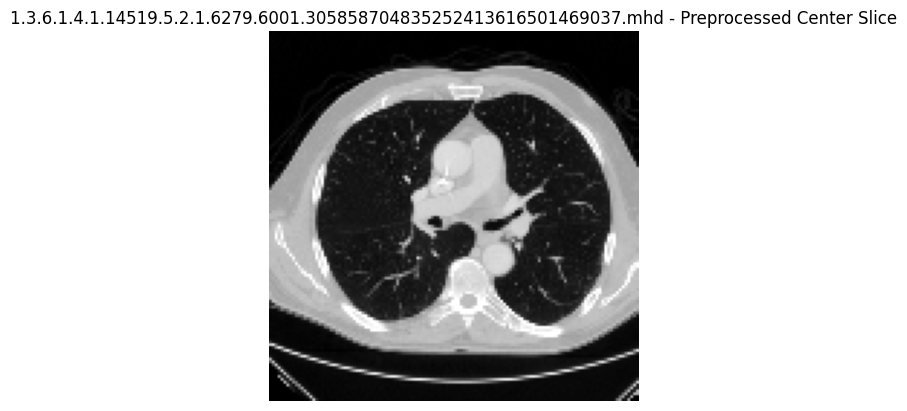

 53%|█████▎    | 94/178 [02:10<02:06,  1.51s/it]

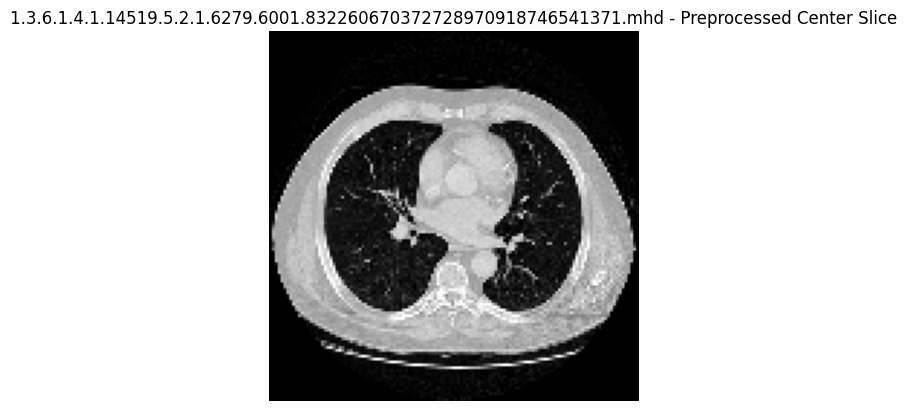

 54%|█████▍    | 97/178 [02:11<01:26,  1.07s/it]

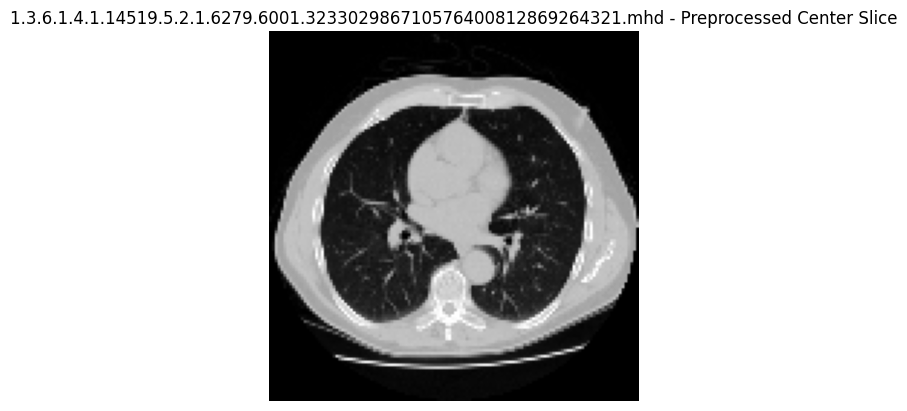

 56%|█████▌    | 100/178 [02:13<01:07,  1.15it/s]

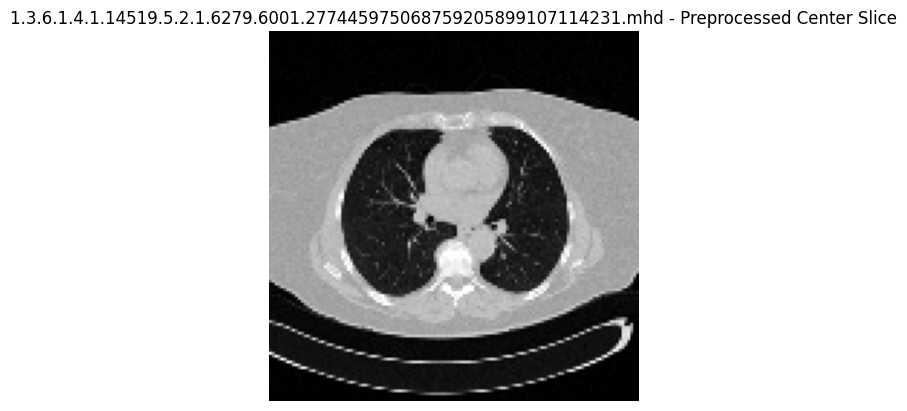

 57%|█████▋    | 101/178 [02:15<01:18,  1.02s/it]

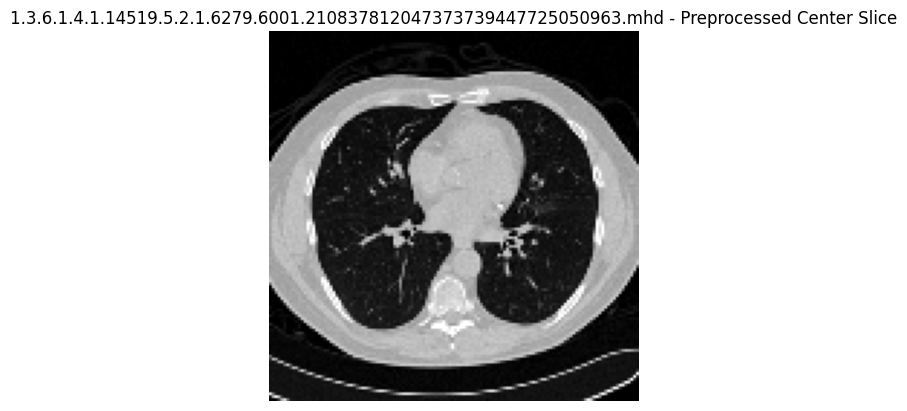

 57%|█████▋    | 102/178 [02:17<01:31,  1.20s/it]

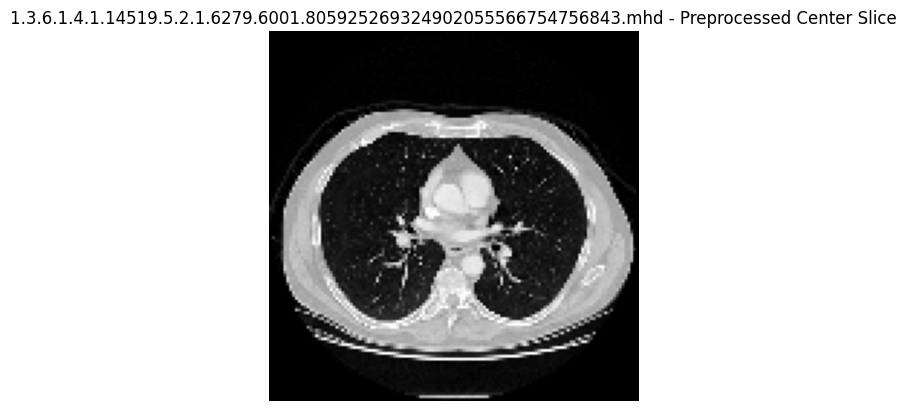

 59%|█████▉    | 105/178 [02:18<01:06,  1.11it/s]

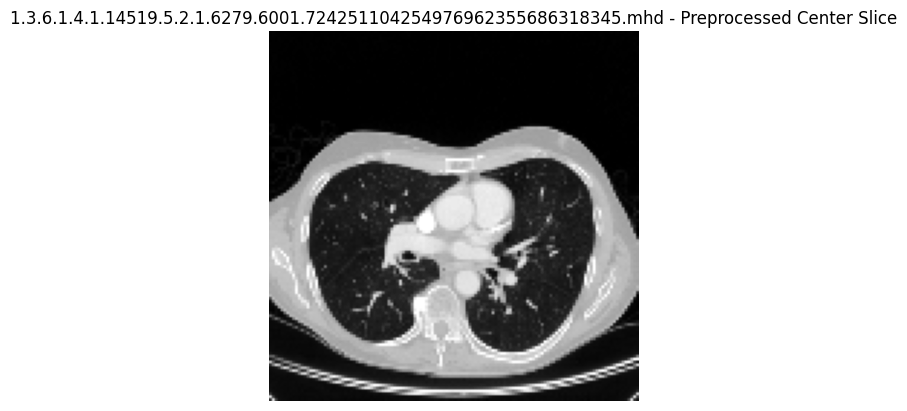

 61%|██████    | 108/178 [02:22<01:11,  1.03s/it]

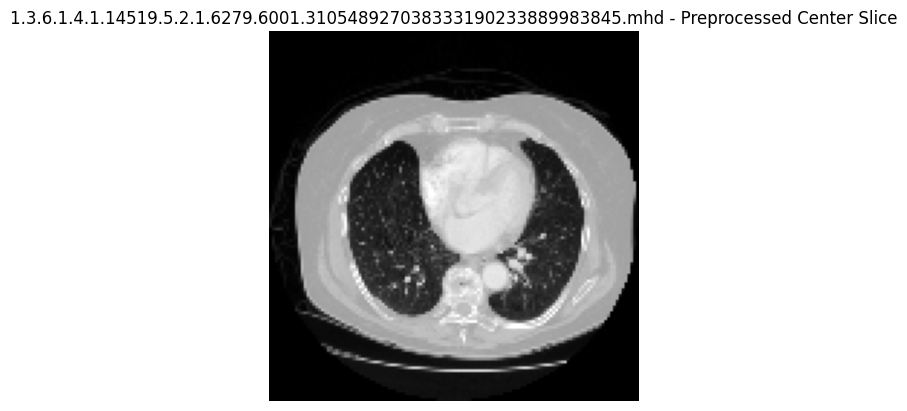

 62%|██████▏   | 110/178 [02:23<01:03,  1.07it/s]

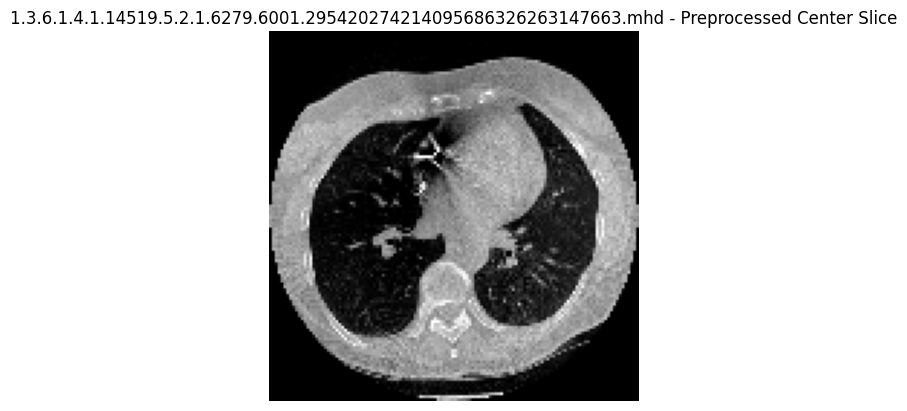

 62%|██████▏   | 111/178 [02:26<01:20,  1.20s/it]

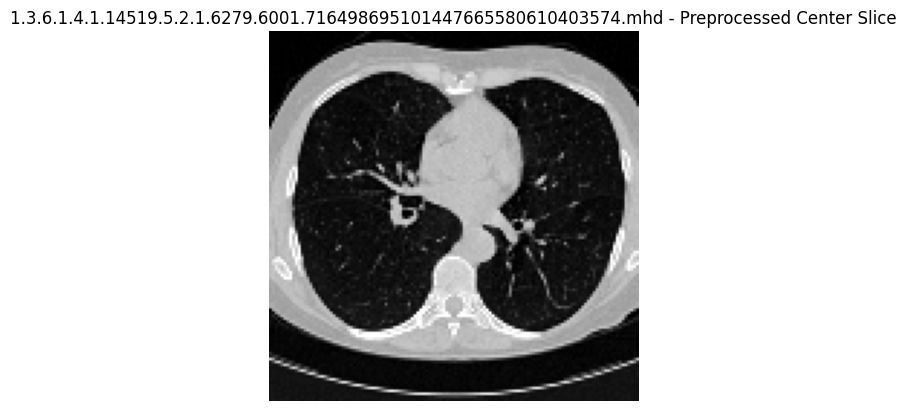

 63%|██████▎   | 113/178 [02:30<01:33,  1.44s/it]

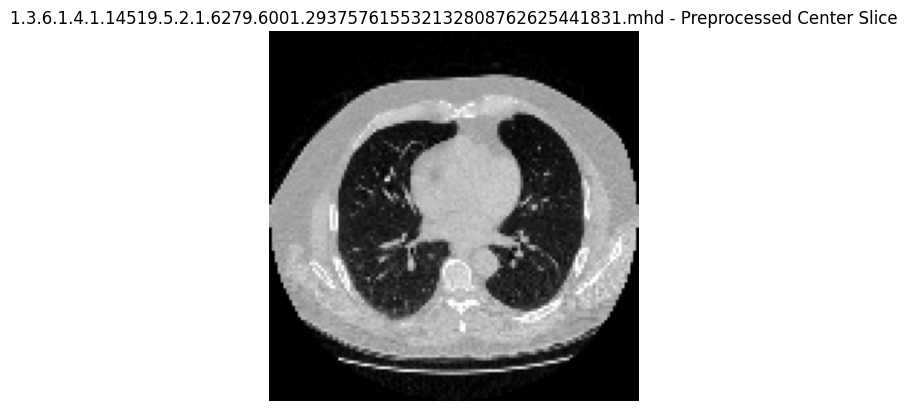

 66%|██████▌   | 117/178 [02:34<01:18,  1.29s/it]

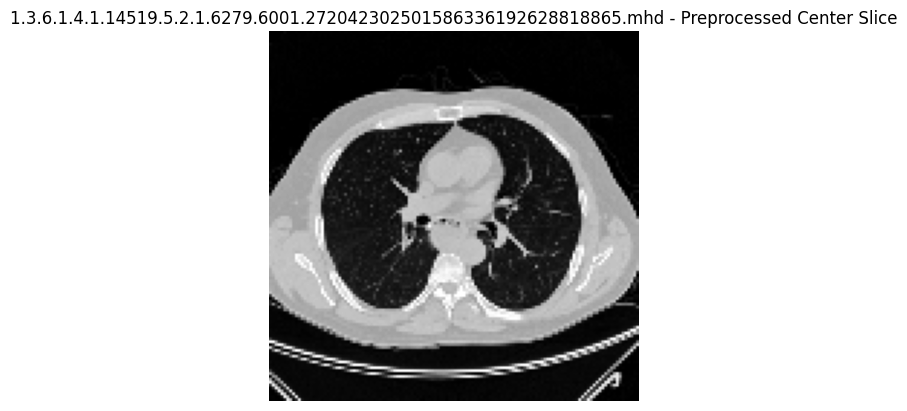

 66%|██████▋   | 118/178 [02:37<01:30,  1.51s/it]

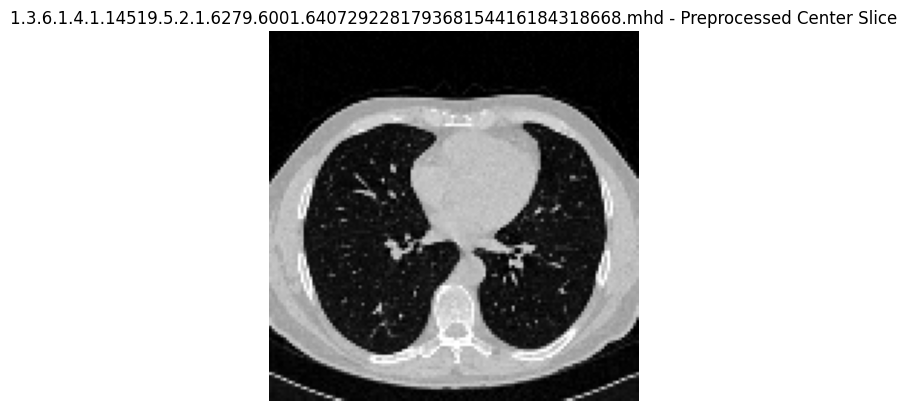

 67%|██████▋   | 119/178 [02:42<01:59,  2.02s/it]

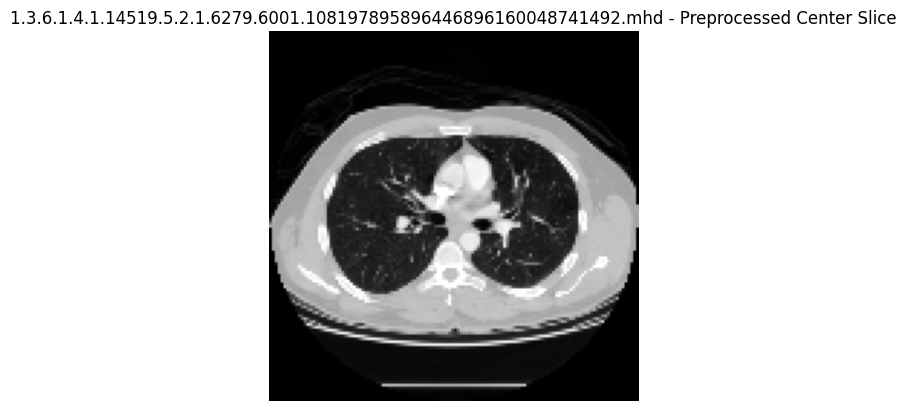

 67%|██████▋   | 120/178 [02:43<01:45,  1.83s/it]

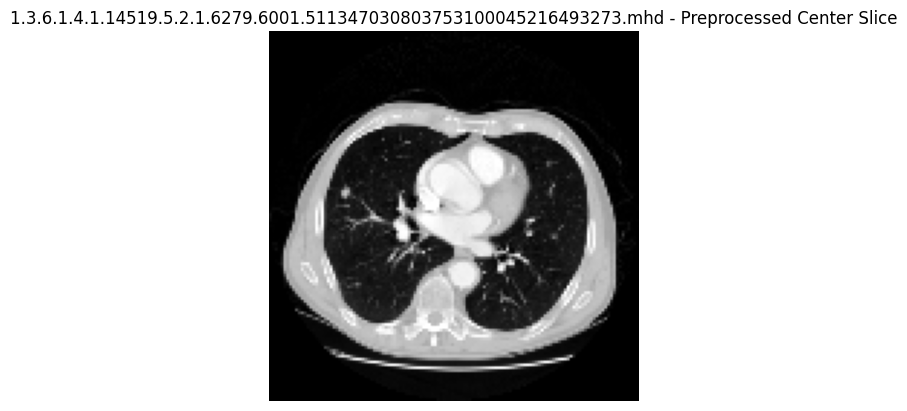

 68%|██████▊   | 121/178 [02:44<01:40,  1.76s/it]

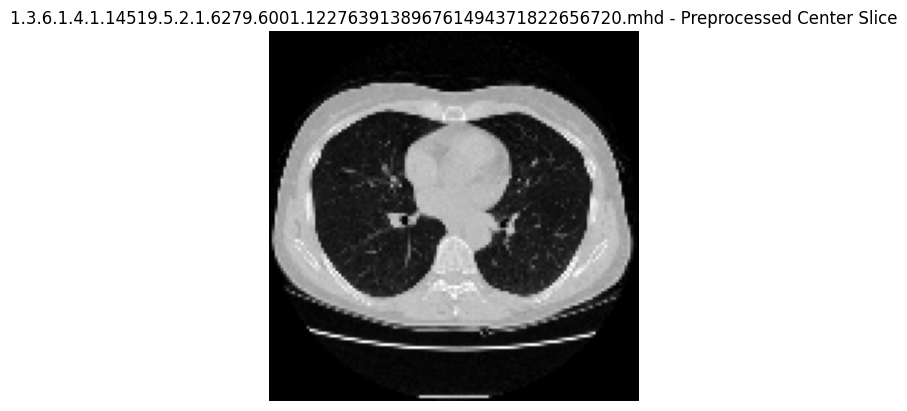

 69%|██████▊   | 122/178 [02:46<01:32,  1.66s/it]

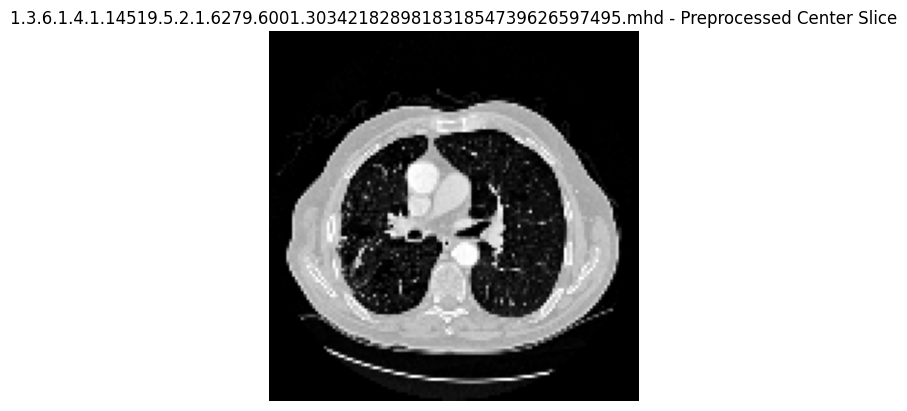

 69%|██████▉   | 123/178 [02:48<01:46,  1.94s/it]

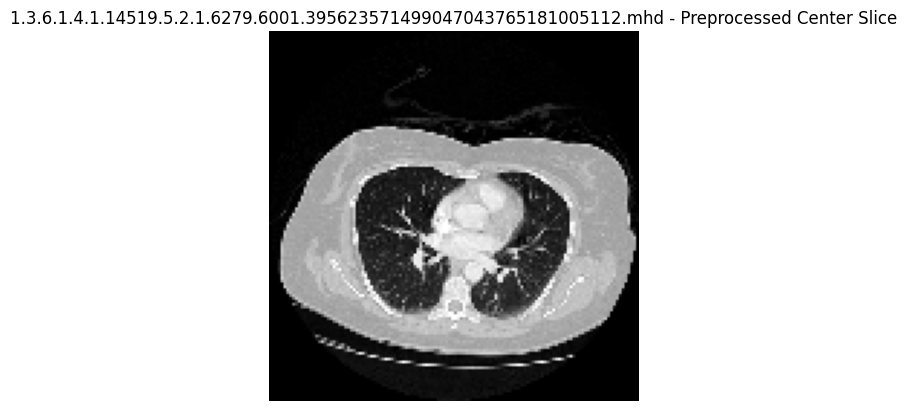

 70%|███████   | 125/178 [02:50<01:13,  1.39s/it]

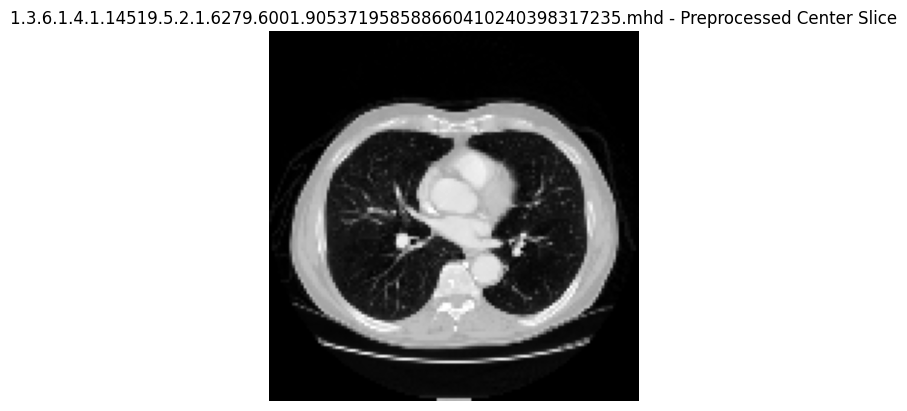

 71%|███████▏  | 127/178 [02:51<00:58,  1.15s/it]

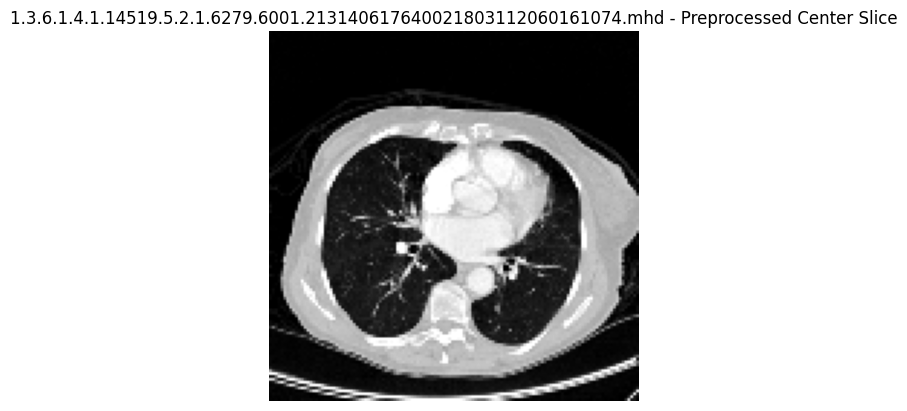

 74%|███████▎  | 131/178 [02:54<00:42,  1.11it/s]

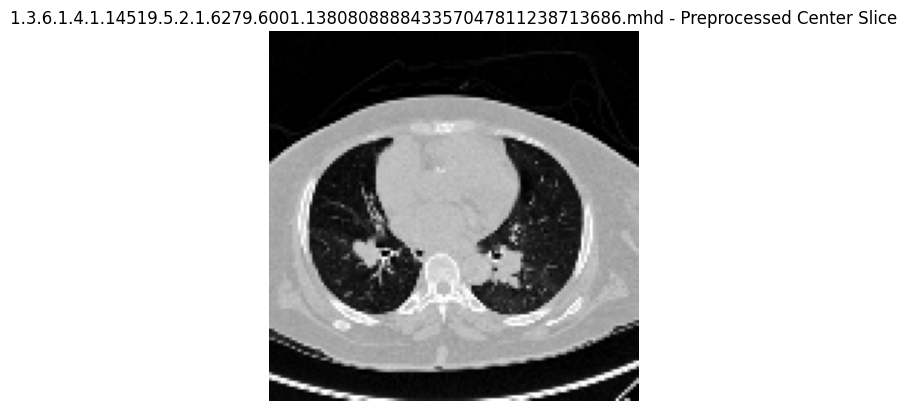

 74%|███████▍  | 132/178 [02:57<00:55,  1.20s/it]

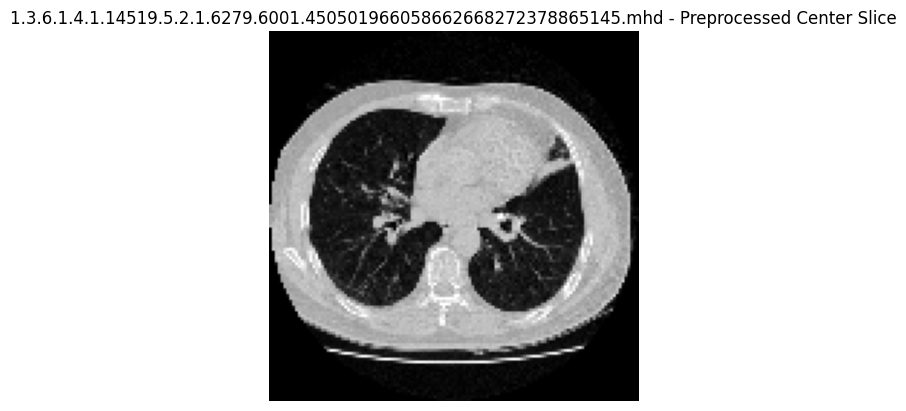

 75%|███████▌  | 134/178 [02:58<00:46,  1.06s/it]

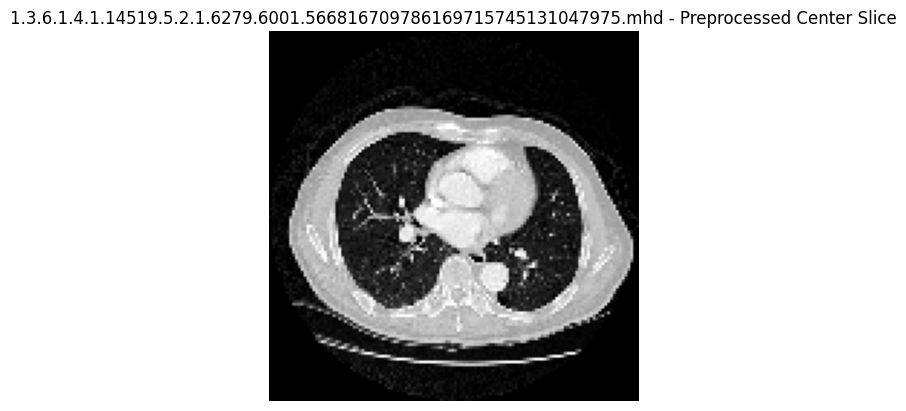

 76%|███████▋  | 136/178 [02:59<00:40,  1.05it/s]

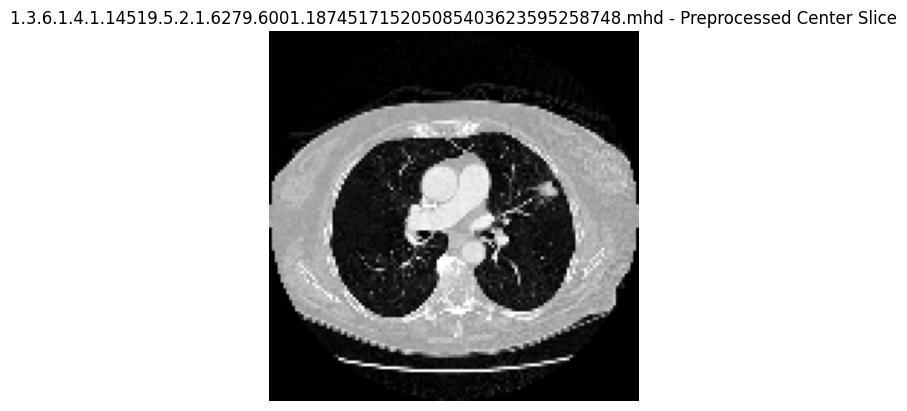

 77%|███████▋  | 137/178 [03:01<00:43,  1.05s/it]

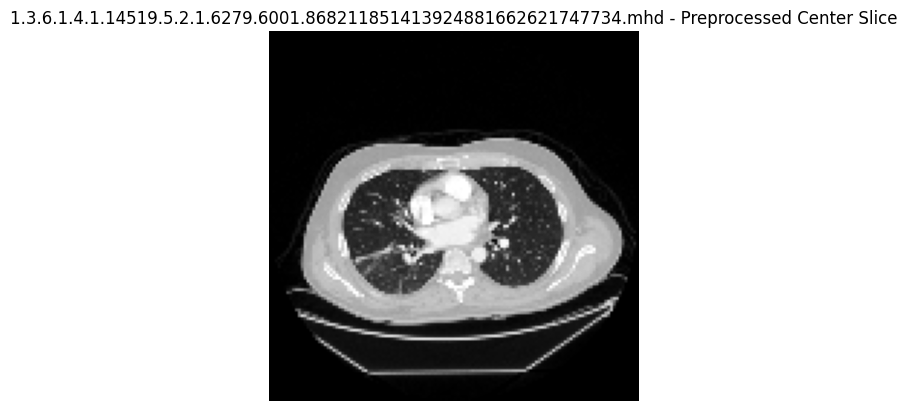

 79%|███████▉  | 141/178 [03:03<00:29,  1.24it/s]

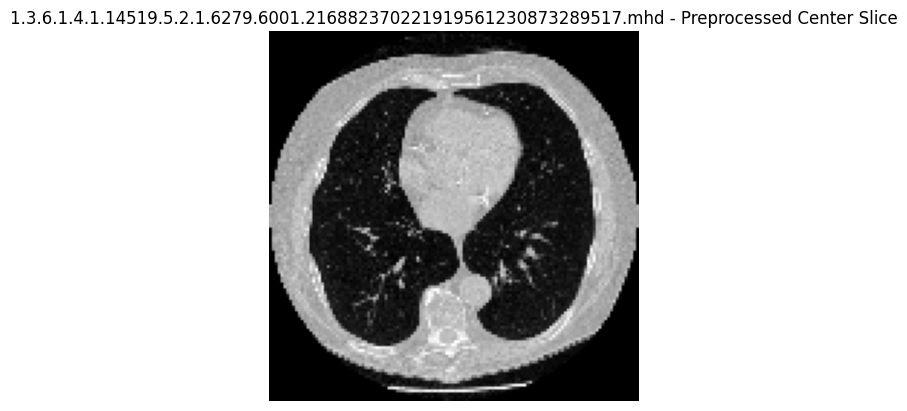

 80%|████████  | 143/178 [03:06<00:33,  1.05it/s]

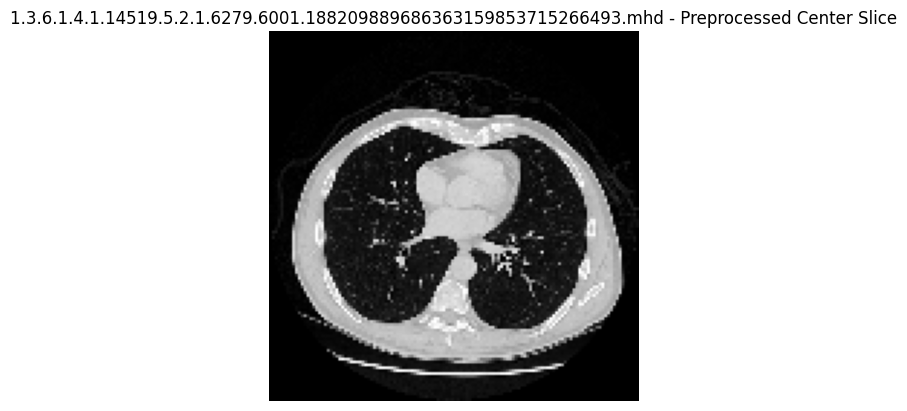

 81%|████████  | 144/178 [03:08<00:35,  1.06s/it]

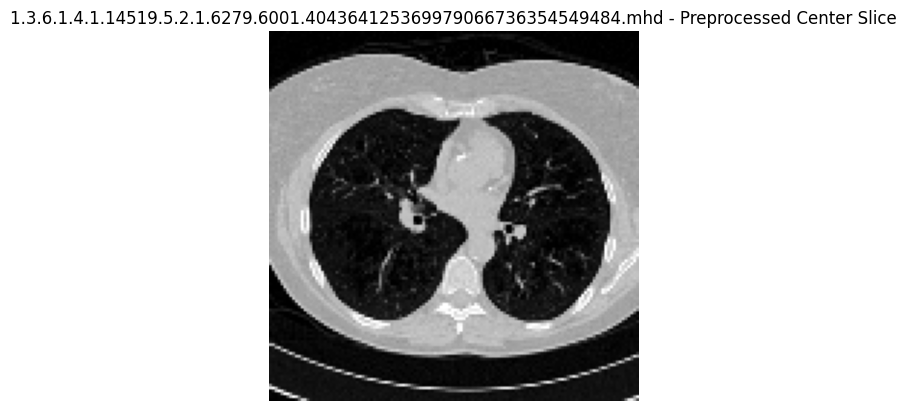

 82%|████████▏ | 146/178 [03:09<00:32,  1.03s/it]

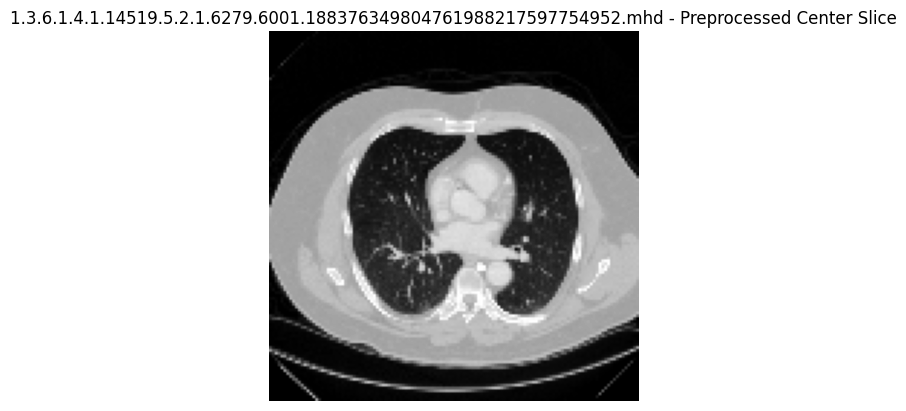

 83%|████████▎ | 148/178 [03:12<00:33,  1.12s/it]

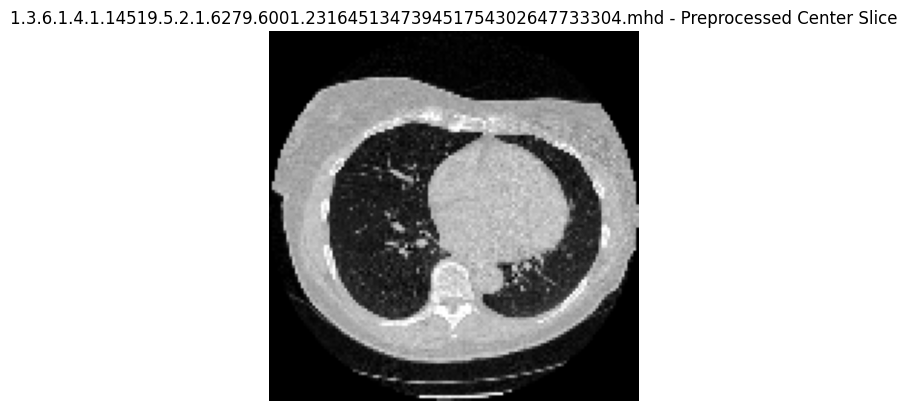

 84%|████████▍ | 150/178 [03:15<00:32,  1.15s/it]

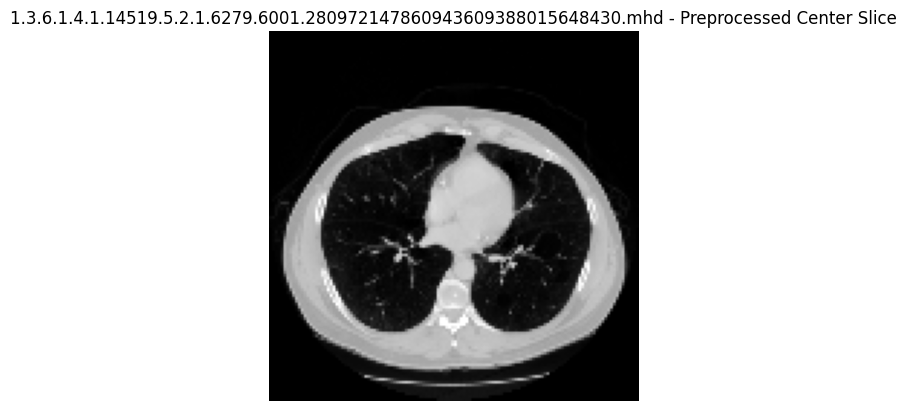

 86%|████████▌ | 153/178 [03:16<00:22,  1.13it/s]

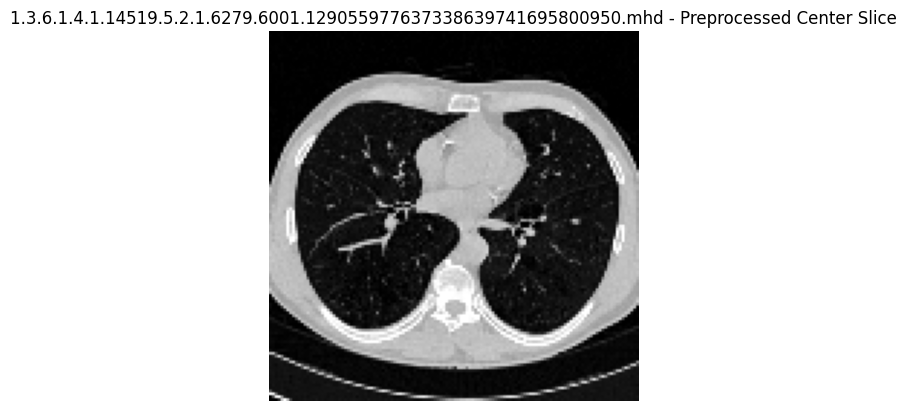

 87%|████████▋ | 155/178 [03:21<00:29,  1.27s/it]

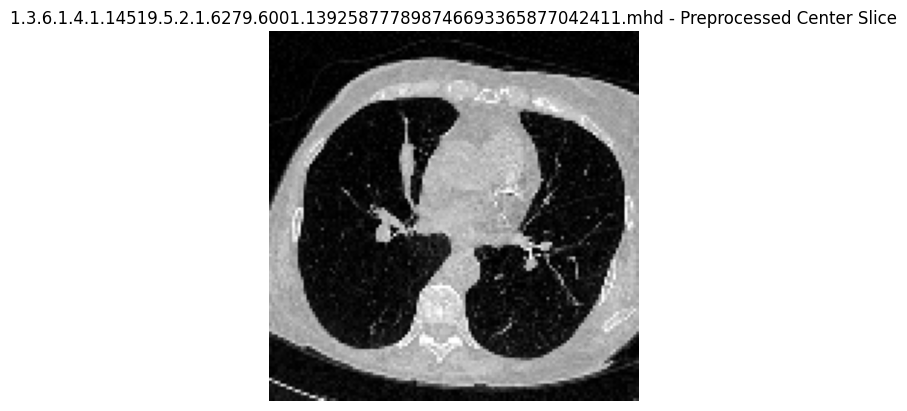

 89%|████████▉ | 159/178 [03:26<00:25,  1.35s/it]

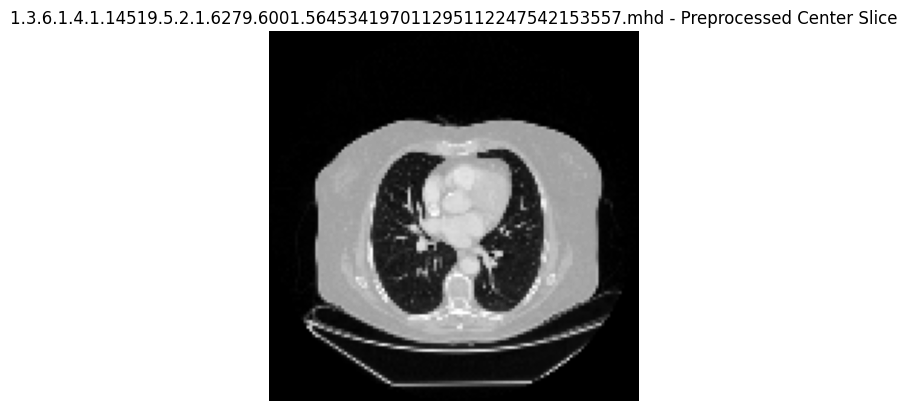

 90%|████████▉ | 160/178 [03:29<00:26,  1.48s/it]

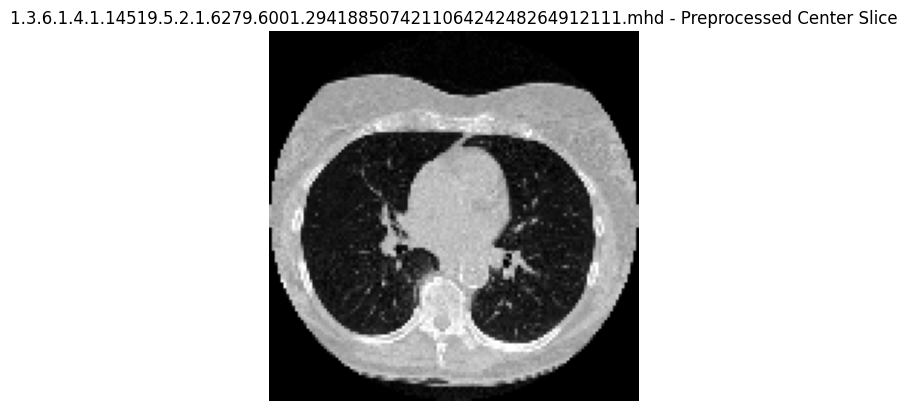

 91%|█████████ | 162/178 [03:31<00:22,  1.42s/it]

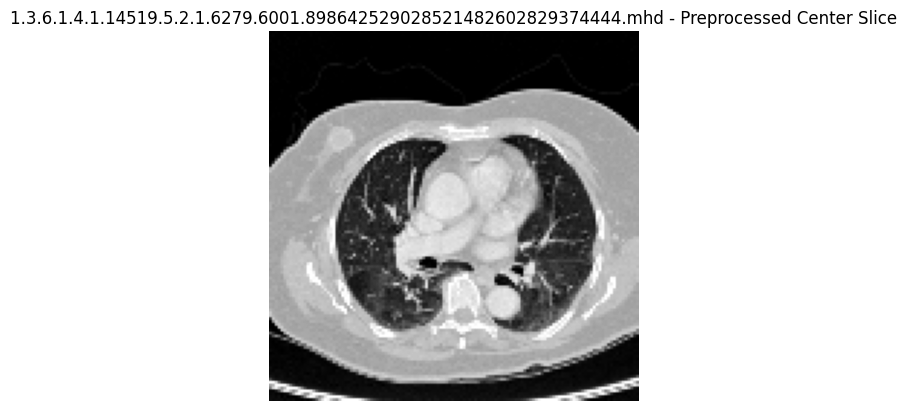

 92%|█████████▏| 164/178 [03:33<00:18,  1.33s/it]

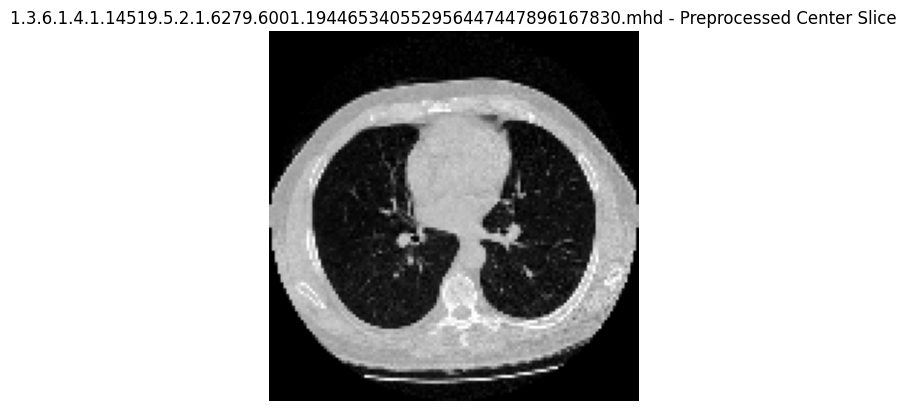

 93%|█████████▎| 166/178 [03:35<00:13,  1.16s/it]

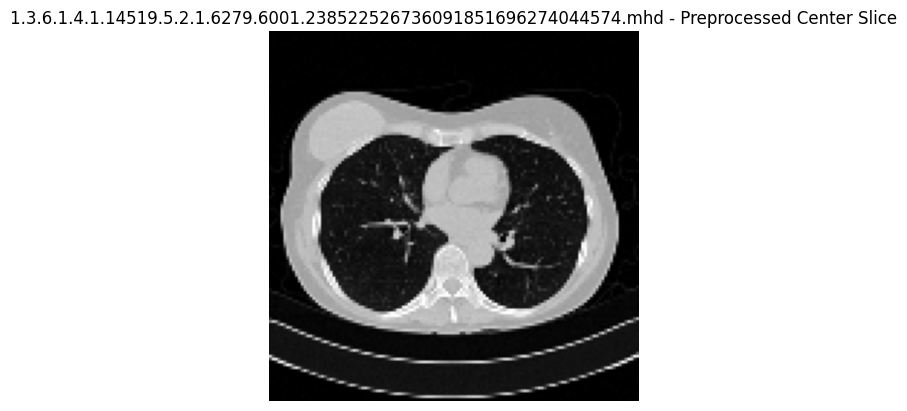

 94%|█████████▍| 167/178 [03:37<00:14,  1.28s/it]

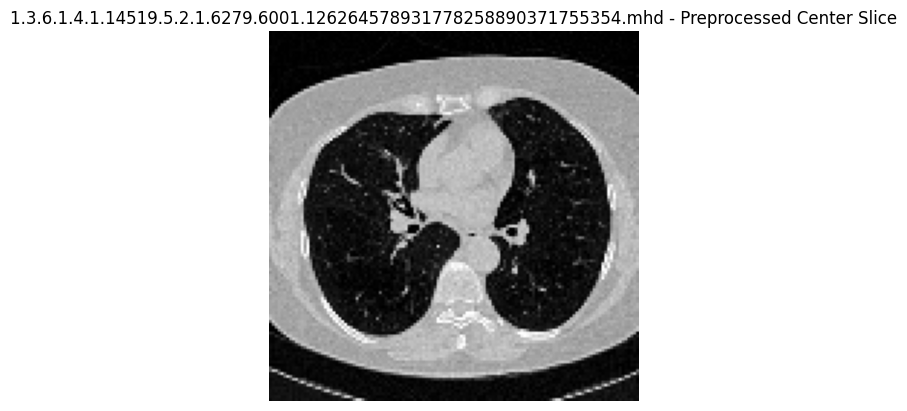

 98%|█████████▊| 174/178 [03:43<00:04,  1.04s/it]

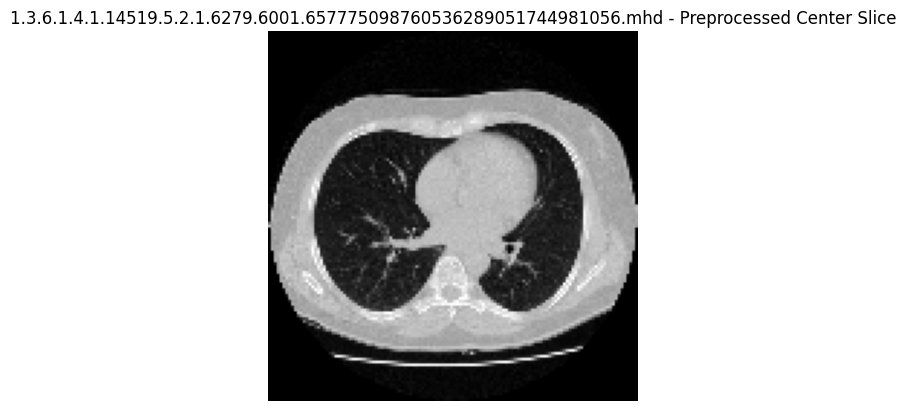

100%|██████████| 178/178 [03:44<00:00,  1.26s/it]

✅ Done. Total PNGs saved: 22870, Label files with nodules: 111


In [20]:
import os
import cv2
import numpy as np
import SimpleITK as sitk
import pandas as pd
from scipy import ndimage
from tqdm import tqdm
import matplotlib.pyplot as plt

# === Paths ===
subset_path = "/kaggle/input/luna16/subset0/subset0"
annotations_csv = "/kaggle/input/luna16/annotations.csv"
output_images = "/kaggle/working/images"
output_labels = "/kaggle/working/labels"
os.makedirs(output_images, exist_ok=True)
os.makedirs(output_labels, exist_ok=True)

# === Load annotations ===
annotations_df = pd.read_csv(annotations_csv)

# === Utility Functions ===
def world_to_voxel(world_coord, origin, spacing):
    return ((world_coord - origin) / spacing).astype(int)

def normalize(volume):
    min_val, max_val = -1000, 400
    volume = np.clip(volume, min_val, max_val)
    return ((volume - min_val) / (max_val - min_val)).astype("float32")

def resize_volume(volume, target_shape=(128, 128, 64)):
    depth_factor = target_shape[2] / volume.shape[0]
    height_factor = target_shape[1] / volume.shape[1]
    width_factor = target_shape[0] / volume.shape[2]
    volume = np.transpose(volume, (1, 2, 0))  # Shape to (H, W, D)
    volume = ndimage.zoom(volume, (height_factor, width_factor, depth_factor), order=1)
    return volume  # Shape: (128, 128, 64)

# === Main Processing ===
png_count = 0
label_count = 0

for file in tqdm(os.listdir(subset_path)):
    if not file.endswith(".mhd"):
        continue

    scan_path = os.path.join(subset_path, file)
    image = sitk.ReadImage(scan_path)
    image_array = sitk.GetArrayFromImage(image)  # (D, H, W)
    origin = np.array(image.GetOrigin())[::-1]
    spacing = np.array(image.GetSpacing())[::-1]

    # Normalize + Resize full volume (for model input)
    volume = normalize(image_array)
    resized_volume = resize_volume(volume)  # Shape: (128, 128, 64)

    # Save center slice for preview (optional)
    plt.imshow(resized_volume[:, :, 32], cmap="gray")
    plt.title(f"{file} - Preprocessed Center Slice")
    plt.axis("off")
    plt.show()

    series_uid = os.path.splitext(file)[0]
    nodules = annotations_df[annotations_df.seriesuid.str.strip().str.lower() == series_uid.strip().lower()]

    # Process each original slice for YOLO-style label saving
    for i, slice_img in enumerate(image_array):  # Original resolution
        filename = f"{series_uid}_{i:03d}.png"
        image_path = os.path.join(output_images, filename)
        resized = cv2.resize(slice_img, (640, 640))
        cv2.imwrite(image_path, resized)
        png_count += 1

        label_path = os.path.join(output_labels, filename.replace('.png', '.txt'))
        with open(label_path, "w") as f:
            written = False
            for _, row in nodules.iterrows():
                center = world_to_voxel(np.array([row.coordZ, row.coordY, row.coordX]), origin, spacing)
                if center[0] == i:
                    x = center[2] / image_array.shape[2]
                    y = center[1] / image_array.shape[1]
                    w = h = (row.diameter_mm / spacing[1]) / image_array.shape[1]
                    if 0 <= x <= 1 and 0 <= y <= 1:
                        f.write(f"0 {x:.6f} {y:.6f} {w:.6f} {h:.6f}\n")
                        written = True
            if written:
                label_count += 1

print(f"✅ Done. Total PNGs saved: {png_count}, Label files with nodules: {label_count}")


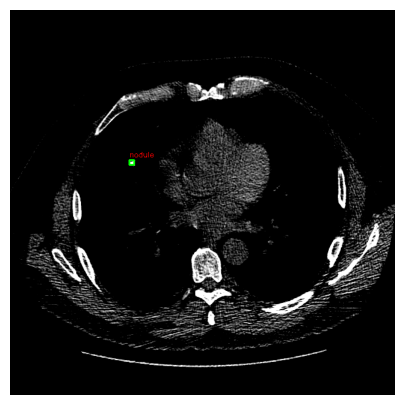

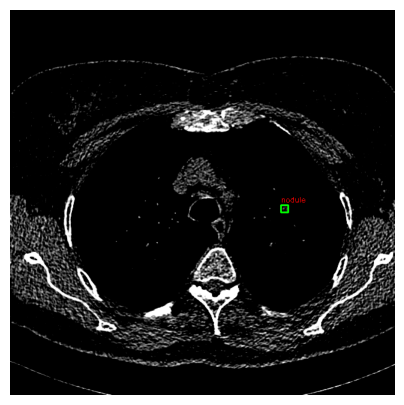

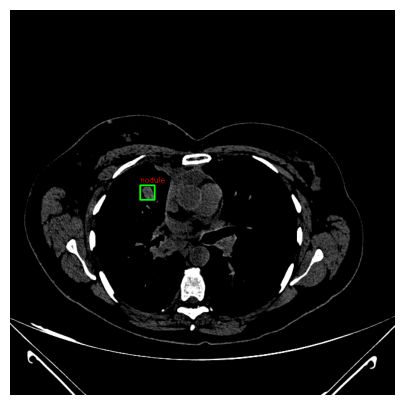

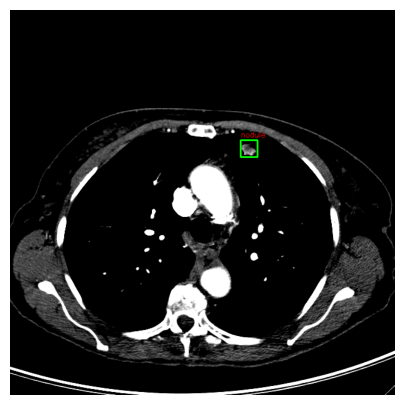

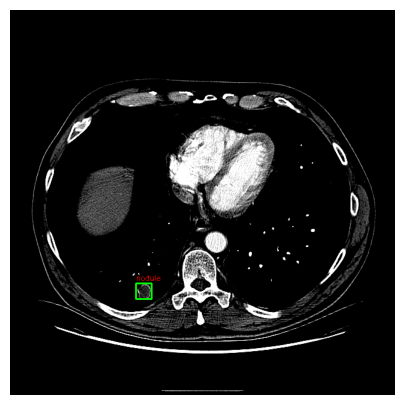

...

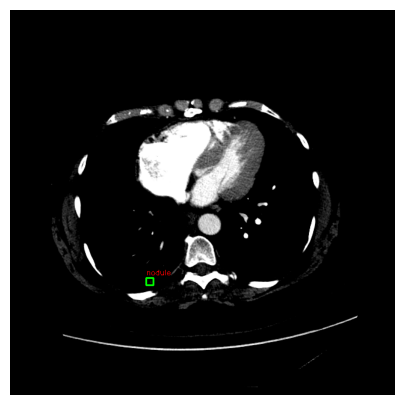

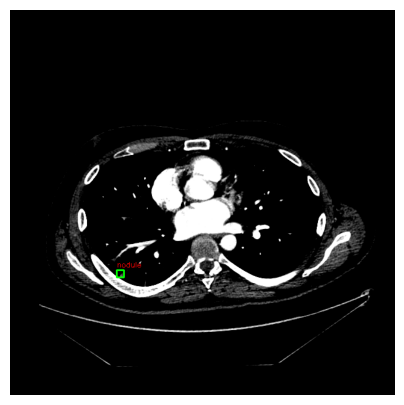

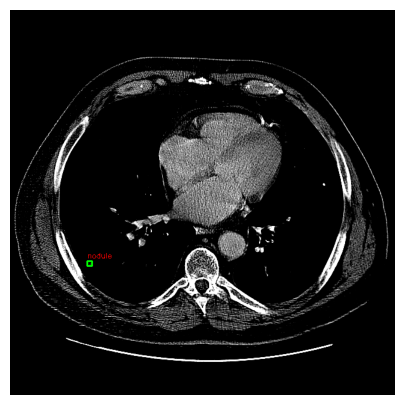

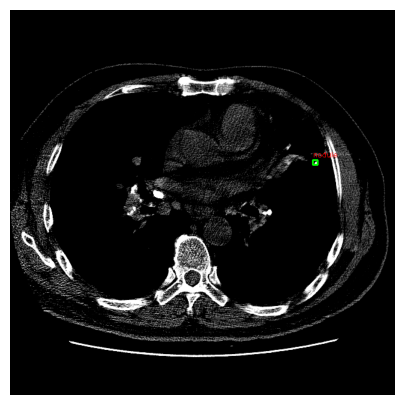

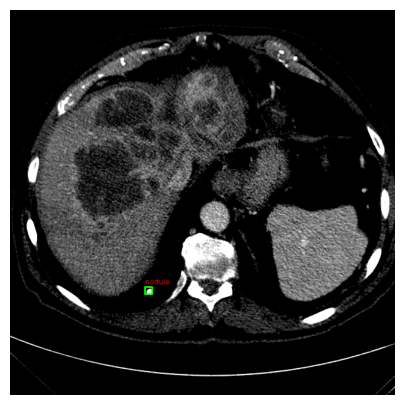

In [21]:
import matplotlib.pyplot as plt
import cv2
import os
import random

def show_image_with_labels(image_path, label_path=None):
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    img = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)
    h, w = img.shape[:2]

    if label_path and os.path.exists(label_path):
        with open(label_path, "r") as f:
            for line in f.readlines():
                cls, x, y, box_w, box_h = map(float, line.strip().split())
                cx, cy = int(x * w), int(y * h)
                bw, bh = int(box_w * w), int(box_h * h)
                top_left = (cx - bw // 2, cy - bh // 2)
                bottom_right = (cx + bw // 2, cy + bh // 2)
                cv2.rectangle(img, top_left, bottom_right, (0, 255, 0), 2)
                cv2.putText(img, "nodule", (top_left[0], top_left[1]-5), cv2.FONT_HERSHEY_SIMPLEX, 0.4, (255, 0, 0), 1)

    plt.figure(figsize=(5, 5))
    plt.imshow(img)
    plt.axis("off")
    plt.show()

# Display a few random labeled images from /kaggle/working/images/
image_dir = "/kaggle/working/images"
label_dir = "/kaggle/working/labels"

# Filter only images that have non-empty label files
label_files = [f for f in os.listdir(label_dir) if os.path.getsize(os.path.join(label_dir, f)) > 0]
sample_labels = random.sample(label_files, 30)

for label_file in sample_labels:
    image_file = label_file.replace(".txt", ".png")
    show_image_with_labels(os.path.join(image_dir, image_file), os.path.join(label_dir, label_file))


In [ ]:
# ✅ Step 1: Split dataset into train/val/test
import os
import shutil
from sklearn.model_selection import train_test_split

# Set the base directory where all PNGs and labels are saved
images_dir = "/kaggle/working/images"
labels_dir = "/kaggle/working/labels"

# Create directories
base_output = "/kaggle/working/lung_dataset"
for split in ["train", "val", "test"]:
    os.makedirs(f"{base_output}/images/{split}", exist_ok=True)
    os.makedirs(f"{base_output}/labels/{split}", exist_ok=True)

# Get all image files
image_files = [f for f in os.listdir(images_dir) if f.endswith(".png")]

# Split
train_files, testval_files = train_test_split(image_files, test_size=0.3, random_state=42)
val_files, test_files = train_test_split(testval_files, test_size=0.5, random_state=42)

# Function to copy image and label
def copy_files(files, split):
    for f in files:
        shutil.copy(os.path.join(images_dir, f), os.path.join(base_output, f"images/{split}", f))
        label_file = f.replace(".png", ".txt")
        label_src = os.path.join(labels_dir, label_file)
        if os.path.exists(label_src):
            shutil.copy(label_src, os.path.join(base_output, f"labels/{split}", label_file))

copy_files(train_files, "train")
copy_files(val_files, "val")
copy_files(test_files, "test")

In [ ]:
lung_yaml = """
train: /kaggle/working/lung_dataset/images/train
val: /kaggle/working/lung_dataset/images/val
test: /kaggle/working/lung_dataset/images/test

nc: 1
names: ['nodule']
"""
with open("/kaggle/working/lung.yaml", "w") as f:
    f.write(lung_yaml)

In [ ]:
! git clone https://github.com/WongKinYiu/yolov7
! cd yolov7
! pip install -q -r ./yolov7/requirements.txt

! wget https://github.com/WongKinYiu/yolov7/releases/download/v0.1/yolov7.pt
! cd ../


In [ ]:
!wandb disabled

In [ ]:
!python ./yolov7/train.py \
--weights yolov7.pt \
--cfg ./yolov7/cfg/training/yolov7.yaml \
--data ./yolov7/data/lung.yaml \
--batch-size 16 \
--epochs 50 \
--img-size 640 640 \
--hyp ./yolov7/data/hyp.scratch.custom.yaml \
--name lung_nodule_run


In [ ]:
hyp_yaml = """
lr0: 0.01
lrf: 0.1
momentum: 0.937
weight_decay: 0.0005
warmup_epochs: 3.0
warmup_momentum: 0.8
warmup_bias_lr: 0.1
box: 0.05
cls: 0.5
cls_pw: 1.0
obj: 1.0
obj_pw: 1.0
iou_t: 0.20
anchor_t: 4.0
fl_gamma: 0.0
hsv_h: 0.015
hsv_s: 0.7
hsv_v: 0.4
degrees: 0.0
translate: 0.1
scale: 0.5
shear: 0.0
perspective: 0.0
flipud: 0.0
fliplr: 0.5
mosaic: 1.0
mixup: 0.0
copy_paste: 0.0
"""
with open("/kaggle/working/hyp.scratch.p5.yaml", "w") as f:
    f.write(hyp_yaml)


In [ ]:
--hyp /kaggle/working/hyp.scratch.p5.yaml


In [ ]:
!python /kaggle/input/yolov7-minorproject/yolov7-main/train.py ...


In [ ]:
# Step 1: Unzip YOLOv7 from the input zip
import zipfile
import os

zip_path = "/kaggle/input/yolov7-minorproject/yolov7-main.zip"  # Adjust if your zip file is named differently
extract_path = "/kaggle/working/yolov7"

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

# Step 2: Write lung.yaml
lung_yaml = """
train: /kaggle/working/lung_dataset/images/train
val: /kaggle/working/lung_dataset/images/val
test: /kaggle/working/lung_dataset/images/test

nc: 1
names: ['nodule']
"""
with open("/kaggle/working/yolov7/data/lung.yaml", "w") as f:
    f.write(lung_yaml)

# Step 3: Write hyp.yaml
hyp_yaml = """
lr0: 0.01
lrf: 0.1
momentum: 0.937
weight_decay: 0.0005
warmup_epochs: 3.0
warmup_momentum: 0.8
warmup_bias_lr: 0.1
box: 0.05
cls: 0.5
cls_pw: 1.0
obj: 1.0
obj_pw: 1.0
iou_t: 0.20
anchor_t: 4.0
fl_gamma: 0.0
hsv_h: 0.015
hsv_s: 0.7
hsv_v: 0.4
degrees: 0.0
translate: 0.1
scale: 0.5
shear: 0.0
perspective: 0.0
flipud: 0.0
fliplr: 0.5
mosaic: 1.0
mixup: 0.0
copy_paste: 0.0
"""
with open("/kaggle/working/yolov7/data/hyp.scratch.p5.yaml", "w") as f:
    f.write(hyp_yaml)
